### Libraries Import

In [17]:
# Supressing the warning messages
import warnings
warnings.filterwarnings('ignore')

# will make plot outputs appear and be stored within the notebook
%matplotlib inline

# import libaries
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import glob
import seaborn as sns
import datetime
from datetime import datetime, timedelta
import geopy.distance
import math
import matplotlib as mpl

#Geo-Visualization
import geopandas as gpd
from shapely.geometry import Point, Polygon
import contextily as ctx

#Machine Learning
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeRegressor, export_graphviz
from sklearn.preprocessing import StandardScaler

#Time Series
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

# 1. Data Collection and Preparation

### Helper Functions

In [18]:
# Data Preparation Function 
def correct_data_types(chicagobikes):
  
    #Converting start-time to datetime
    chicagobikes['start'] = pd.to_datetime(chicagobikes['start_time']).dt.floor('min')
    #Converting end-time to datetime
    chicagobikes['end'] = pd.to_datetime(chicagobikes['end_time']).dt.floor('min')
    
   
    # rounding start time
    chicagobikes['time_rounded'] = chicagobikes['start'].dt.floor('H')
    
    # The day of the week with Monday=0, Sunday=6, week of year, month, day of month, hour of day
    chicagobikes['weekday'] = chicagobikes['time_rounded'].dt.weekday
    chicagobikes['week'] = chicagobikes['time_rounded'].dt.week
    chicagobikes['month'] = chicagobikes['time_rounded'].dt.month
    chicagobikes['day_of_month'] = chicagobikes['time_rounded'].dt.day
    chicagobikes['hour_of_day'] = chicagobikes['time_rounded'].dt.hour
  
    #trip duration
    chicagobikes['trip_duration'] = chicagobikes['end'] - chicagobikes['start']
    chicagobikes['trip_duration_minutes'] = chicagobikes['trip_duration'].dt.total_seconds()/60
    #date
    chicagobikes['date'] = chicagobikes['time_rounded'].dt.date
    # calculate trips per hour
    chicagobikes['trips_per_hour']= chicagobikes.groupby(['time_rounded'])['time_rounded'].transform('count')
    
    return chicagobikes

In [19]:
def moving_average(array,n):
    target = []
    rng = n / 2 - 0.5
    rng = int(rng)
    i = 0
    while i < len(array):
        value = 0
        if (i >= rng-1) & (i< len(array)-rng):
            value = sum(array[i-rng:i+rng+1])/n
        target.append(value)
        i = i + 1
    i = 0
    while i < rng:
        target[i] = target[rng]
        target[-i-1] = target[-rng-1]
        i = i + 1
        
    return target

In [20]:
def min_max_scaling(df):
    # copy the dataframe
    df_norm = df.copy()
    # apply min-max scaling
    for column in df_norm.columns:
        df_norm[column] = (df_norm[column] - df_norm[column].min()) / (df_norm[column].max() - df_norm[column].min())
        
    return df_norm

In [21]:
#fleet size calculation function
def fleet_size(df,factor):
    
    start_date = df.date.min()
    end_date = df.date.max()
    delta = pd.to_timedelta("1d")
    dates = []
    while start_date <= end_date:
        dates.append(start_date)
        start_date += delta
    
    
    fleet_size = pd.DataFrame([], index = dates, columns = ["fleet_size"]) 

    search_array = []
    values = []
    for index, row in fleet_size.iterrows():
        search_array.append(index)
        if len(search_array) > factor:
            search_array.pop(0)
        values.append(df[df["date"].isin(search_array[:])].bike_id.nunique())
        
    i = 0
    
    #correct size
    correction = values[factor-1]
    while i < factor-1:
        values[i] = correction
        i = i + 1
    fleet_size["fleet_size"] = values
    
    return fleet_size

In [22]:
# Weather Preparation Function
def correct_weather(x):
  
    #Converting date to datetime
    x['date'] = pd.to_datetime(x['date_time'])
    #add weekday
    x['weekday'] = x['date'].dt.weekday
    #add week of year
    x['week'] = x['date'].dt.isocalendar().week
    return x

## Divvy Data

## 1.1 Import

In [23]:
# load .csv into pandas dataframe
# As the data too big for github, it is necessary to get the dataframe from the definition of the task
chicago_2017 = pd.read_csv('./chicago_2017.csv')

## 1.2 Searching NaNs

#### No data seems to be missing 

In [9]:
# NaN?
chicago_2017.isna().sum()

start_time            0
end_time              0
start_station_id      0
end_station_id        0
start_station_name    0
end_station_name      0
bike_id               0
user_type             0
dtype: int64

In [10]:
# no. of unique values
chicago_2017.nunique()

start_time            2823388
end_time              2736001
start_station_id          585
end_station_id            585
start_station_name        593
end_station_name          593
bike_id                  6243
user_type                   3
dtype: int64

In [199]:
#start stations and count 
chicago_2017['start_station_name'].value_counts()

Streeter Dr & Grand Ave         97571
Lake Shore Dr & Monroe St       53400
Canal St & Adams St             50911
Clinton St & Washington Blvd    49832
Theater on the Lake             47908
                                ...  
Throop St & 52nd St                 9
Seeley Ave & Garfield Blvd          8
Vernon Ave & 79th St                6
Ashland Ave & 66th St               4
Phillips Ave & 82nd St              3
Name: start_station_name, Length: 593, dtype: int64

In [200]:
#end stations and count
chicago_2017['end_station_name'].value_counts()

Streeter Dr & Grand Ave        106023
Lake Shore Dr & North Blvd      53091
Canal St & Adams St             52608
Theater on the Lake             50781
Clinton St & Madison St         50298
                                ...  
Ashland Ave & Garfield Blvd         8
Throop St & 52nd St                 5
Ashland Ave & 66th St               4
Vernon Ave & 79th St                4
Phillips Ave & 82nd St              2
Name: end_station_name, Length: 593, dtype: int64

In [201]:
#there seem to be 3 usertypes
chicago_2017['user_type'].value_counts()

Subscriber    2992135
Customer       836872
Dependent           7
Name: user_type, dtype: int64

## 1.3 Cleaning

In [24]:
# Lets drop dependent entries, because only 7
chicago_2017 = chicago_2017[chicago_2017.user_type != 'Dependent']

## 1.4 Apply helper function

This will add few extra columns for analysis 

In [25]:
#apply functions for year 2017
chicago_data = correct_data_types(chicago_2017)

In [26]:
#calculate fleet size
fleet = fleet_size(chicago_data,10)

In [27]:
#add fleet size column
chicago_data = pd.merge(chicago_data, fleet, left_on='date', right_on=fleet.index, how='inner')

In [28]:
# daily columns 
chicago_features = chicago_data.groupby("date").agg(
        daily_trips=("bike_id","count"),
        daily_avg_length = ("trip_duration_minutes","mean"),
        daily_used_bikes = ('bike_id', pd.Series.nunique))

In [208]:
#add daily columns
chicago_data = pd.merge(chicago_data, chicago_features, left_on='date',right_on=chicago_features.index, how='inner')

In [ ]:
#hourly columns 
chicago_features_hourly = chicago_data.groupby("time_rounded").agg(
        hourly_avg_length = ("trip_duration_minutes","mean"),
        hourly_used_bikes = ('bike_id', pd.Series.nunique))

In [ ]:
#add hourly columns
chicago_data = pd.merge(chicago_data, chicago_features_hourly, left_on='date',right_on=chicago_features.index, how='inner')

## 1.5 Create per hour dataframe

In [209]:
#Create additional dataframe
#drop rows with identical time_rounded values for next step, so we have 1 representative row per hour
filtered_df = chicago_data.drop_duplicates(subset='time_rounded')

In [210]:
#drop irrelevant rows
filtered_df.drop(['start_station_id','end_station_id','start_station_name', 'end_station_name', 'bike_id'], axis=1, inplace=True)

In [211]:
filtered_df.head()

,start_time,end_time,user_type,start,end,time_rounded,weekday,week,month,day_of_month,hour_of_day,trip_duration,trip_duration_minutes,date,trips_per_hour,fleet_size,daily_trips,daily_avg_length,daily_used_bikes
0,3/31/2017 23:59:07,4/1/2017 00:13:24,Subscriber,2017-03-31 23:59:00,2017-04-01 00:13:00,2017-03-31 23:00:00,4,13,3,31,23,0 days 00:14:00,14.0,2017-03-31,49,3894,5115,10.62737,1945
49,3/31/2017 22:59:11,3/31/2017 23:07:12,Subscriber,2017-03-31 22:59:00,2017-03-31 23:07:00,2017-03-31 22:00:00,4,13,3,31,22,0 days 00:08:00,8.0,2017-03-31,95,3894,5115,10.62737,1945
144,3/31/2017 21:57:02,3/31/2017 22:07:38,Subscriber,2017-03-31 21:57:00,2017-03-31 22:07:00,2017-03-31 21:00:00,4,13,3,31,21,0 days 00:10:00,10.0,2017-03-31,92,3894,5115,10.62737,1945
236,3/31/2017 20:59:31,3/31/2017 21:30:33,Subscriber,2017-03-31 20:59:00,2017-03-31 21:30:00,2017-03-31 20:00:00,4,13,3,31,20,0 days 00:31:00,31.0,2017-03-31,148,3894,5115,10.62737,1945
384,3/31/2017 19:59:56,3/31/2017 20:10:43,Subscriber,2017-03-31 19:59:00,2017-03-31 20:10:00,2017-03-31 19:00:00,4,13,3,31,19,0 days 00:11:00,11.0,2017-03-31,275,3894,5115,10.62737,1945


### 1.5.1 Looking for NaNs

In [212]:
#Let's look for missing hourly data
filtered_df.sort_values(by=['time_rounded'], inplace=True)
filtered_df = filtered_df.set_index('time_rounded')

#Lets show missing hourly values
filtered_times = pd.date_range(start = filtered_df.index.min(), end = filtered_df.index.max(), freq='H')

filtered_times.difference(filtered_df.index)

DatetimeIndex(['2017-01-09 03:00:00', '2017-01-17 03:00:00',
               '2017-02-09 02:00:00', '2017-02-10 03:00:00',
               '2017-03-07 02:00:00', '2017-03-12 02:00:00',
               '2017-03-30 02:00:00', '2017-12-20 00:00:00',
               '2017-12-20 01:00:00', '2017-12-20 02:00:00',
               '2017-12-20 03:00:00', '2017-12-20 04:00:00',
               '2017-12-20 05:00:00', '2017-12-25 23:00:00',
               '2017-12-26 01:00:00', '2017-12-27 02:00:00',
               '2017-12-30 05:00:00'],
              dtype='datetime64[ns]', freq=None)

### 1.5.2 Dealing with missing data

In [213]:
#reindex and reset
filtered_df = filtered_df.reindex(filtered_times).reset_index()
#rename
filtered_df.rename(columns={'index': 'time_rounded'}, inplace=True)

In [214]:
#Let's fill missing hours


#we just assume 0 rides in those hours
filtered_df['trips_per_hour'].fillna(value=0, inplace=True) 

#other columns
filtered_df['weekday'].fillna(method="ffill", inplace=True) 
filtered_df['week'].fillna(method="ffill", inplace=True) 
filtered_df['day_of_month'].fillna(method="ffill", inplace=True) 
filtered_df['hour_of_day'].fillna(method="ffill", inplace=True) 
filtered_df['month'].fillna(method="ffill", inplace=True)

## Weather Data

## 1.6 Import

In [215]:
# load .csv into pandas dataframe
# As the data too big for github, it is necessary to get the dataframe from the definition of the task
weather_data = pd.read_csv('/Users/Lukas/Downloads/Chicago/Weather/weather_hourly_chicago.csv')

In [216]:
#overview
weather_data.head()

,date_time,max_temp,min_temp,precip
0,2015-01-02 01:00:00,-1.7,-1.7,0.0
1,2015-01-02 02:00:00,-2.2,-2.2,0.0
2,2015-01-02 03:00:00,-2.8,-2.8,0.0
3,2015-01-02 04:00:00,-3.3,-3.3,0.0
4,2015-01-02 05:00:00,-4.4,-4.4,0.0


In [217]:
weather_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43848 entries, 0 to 43847
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   date_time  43788 non-null  object 
 1   max_temp   43788 non-null  float64
 2   min_temp   43788 non-null  float64
 3   precip     43790 non-null  float64
dtypes: float64(3), object(1)
memory usage: 1.3+ MB


## 1.7 Apply Helper Function

In [218]:
#apply function
weather_data = correct_weather(weather_data)

In [219]:
weather_data.head()

,date_time,max_temp,min_temp,precip,date,weekday,week
0,2015-01-02 01:00:00,-1.7,-1.7,0.0,2015-01-02 01:00:00,4.0,1
1,2015-01-02 02:00:00,-2.2,-2.2,0.0,2015-01-02 02:00:00,4.0,1
2,2015-01-02 03:00:00,-2.8,-2.8,0.0,2015-01-02 03:00:00,4.0,1
3,2015-01-02 04:00:00,-3.3,-3.3,0.0,2015-01-02 04:00:00,4.0,1
4,2015-01-02 05:00:00,-4.4,-4.4,0.0,2015-01-02 05:00:00,4.0,1


### 1.7.1 Looking for NaNs and missing rows

In [220]:
#NaN?
weather_data.isna().sum()

date_time    60
max_temp     60
min_temp     60
precip       58
date         60
weekday      60
week         60
dtype: int64

In [221]:
weather_data.head(2539)

,date_time,max_temp,min_temp,precip,date,weekday,week
0,2015-01-02 01:00:00,-1.7,-1.7,0.0,2015-01-02 01:00:00,4.0,1
1,2015-01-02 02:00:00,-2.2,-2.2,0.0,2015-01-02 02:00:00,4.0,1
2,2015-01-02 03:00:00,-2.8,-2.8,0.0,2015-01-02 03:00:00,4.0,1
3,2015-01-02 04:00:00,-3.3,-3.3,0.0,2015-01-02 04:00:00,4.0,1
4,2015-01-02 05:00:00,-4.4,-4.4,0.0,2015-01-02 05:00:00,4.0,1
...,...,...,...,...,...,...,...
2534,2015-04-16 15:00:00,8.9,8.9,0.0,2015-04-16 15:00:00,3.0,16
2535,2015-04-16 16:00:00,9.4,9.4,0.0,2015-04-16 16:00:00,3.0,16
2536,2015-04-16 16:00:00,10.6,10.0,0.0,2015-04-16 16:00:00,3.0,16
2537,NaN,NaN,NaN,NaN,NaT,NaN,<NA>


There seems to be missing data!

Dataframe has weird properties: some hourly data seems to be missing, whereas other hourly data is reported twice
Example row: 2535 and 2536 display the same time, whereas 2537 displays NaN

We conclude that, duplicates were simply mislabeled, NaNs were not labeled at all.

### 1.7.2 Fixing NaNs

In [222]:
#sort values by date
weather_data.sort_values(by=['date'], inplace=True)

In [223]:
#drop NaN rows
weather_data.dropna(inplace=True)

In [224]:
#Let's drop rows with duplicate hourly values
weather_data = weather_data.drop_duplicates(subset=['date'], keep=False)

In [225]:
#reindex by timeframe of weather data to add missing hourly data rows

#set date column as index
weather_data.set_index('date', inplace=True)

#create hourly daterange 
all_times = pd.date_range(start='2015-01-01 01:00:00', end=weather_data.index.max(), freq ='H')

#reindex by range and reset index
weather_data = weather_data.reindex(all_times).reset_index()

In [226]:
#NaNs from missing rows 
weather_data.isna().sum()

index           0
date_time    5722
max_temp     5722
min_temp     5722
precip       5722
weekday      5722
week         5722
dtype: int64


Impute missing data (because missing data can be estimated easily and more accurate results)


In [227]:
#interpolation for weather data
weather_data['max_temp'].interpolate(method='slinear', inplace=True) 
weather_data['min_temp'].interpolate(method='slinear', inplace=True) 

#backward fill for precip (snow etc.) because can only be 0 or 1
weather_data['precip'].fillna(method='bfill', inplace=True) 

#drop columns not needed
weather_data = weather_data[['index', 'max_temp', 'min_temp', 'precip']]

In [228]:
#6 more Nans and simplified df!
weather_data.isna().sum()

index       0
max_temp    6
min_temp    6
precip      0
dtype: int64

In [229]:
#Lets fix those 7 NaNs in the beginning of dataset
#we will use fillna function as interpolation didnt work for those
weather_data['max_temp'].fillna(method='bfill', inplace=True)
weather_data['min_temp'].fillna(method='bfill', inplace=True)

In [230]:
weather_data.isna().sum()

index       0
max_temp    0
min_temp    0
precip      0
dtype: int64

# 2. Descriptive Analytics

## 2.1 Temporal Demand Patterns and Seasonality

In [42]:
# Demonstrate how fleet usage varies during a day, a week and the year. 
# What patterns do you observe? Explain.

### 2.1.1 Overview

Text(0.5, 1.0, ' Chicago: amount of trips over the year 2017')

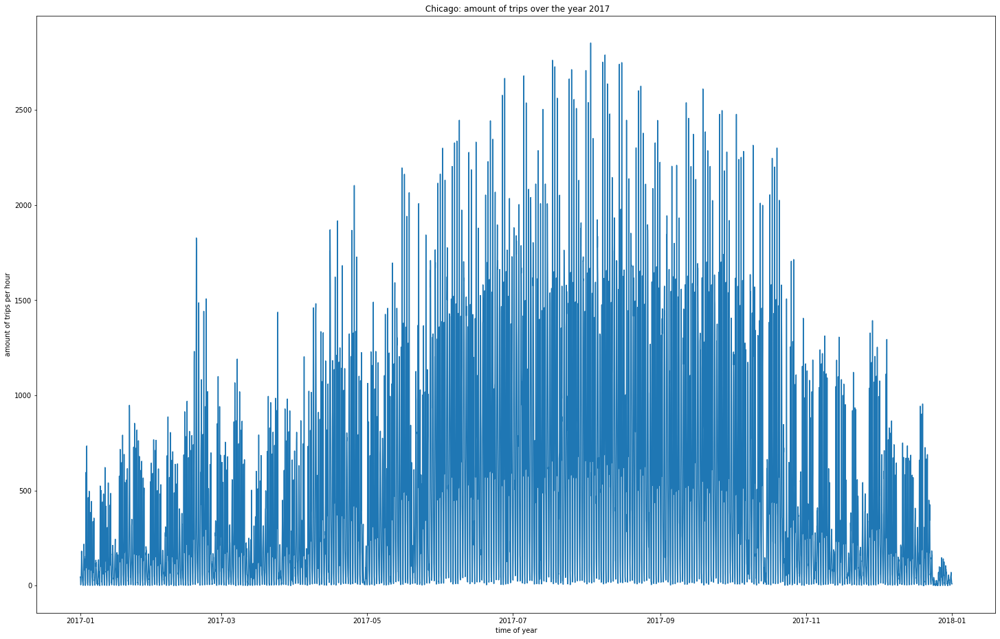

In [231]:
#plot hourly trips over year
plt.figure(figsize=(25,16))
plt.plot(filtered_df['time_rounded'], filtered_df['trips_per_hour'])
plt.xlabel('time of year')
plt.ylabel('amount of trips per hour')
plt.title(' Chicago: amount of trips over the year 2017')

### 2.1.2 Trip Duration

In [232]:
#create df
durat = chicago_data[['trip_duration', 'time_rounded', 'user_type']]
#convert to datetime and call hour of day and trip duration in minutes
durat['time_rounded'] = durat['time_rounded'].dt.hour
durat['trip_duration'] = durat['trip_duration'].dt.seconds.div(60)

Text(0.5, 1.0, 'Rides per trip duration')

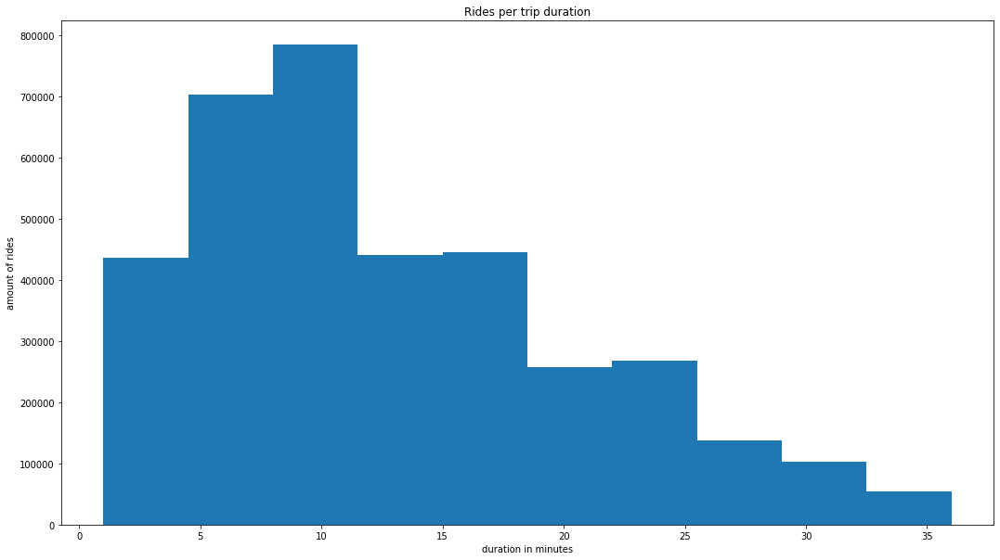

In [233]:
duration = durat['trip_duration']
plt.figure(figsize=(18,10))
duration[duration < duration.quantile(.95)].plot.hist()
plt.xlabel('duration in minutes')
plt.ylabel('amount of rides')
plt.title('Rides per trip duration')

Most rides seem to take about 5-10 minutes

Text(0.5, 1.0, 'Rides per duration and user type')

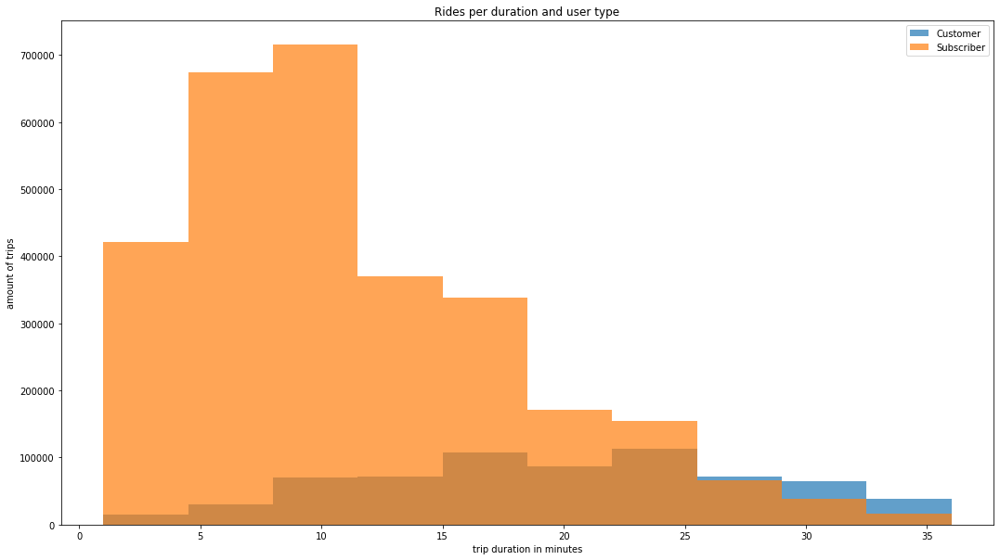

In [234]:
# trip_duration distribution by customer type
plt.figure(figsize=(18,10))
# plot histogram grouped by usertype
durat[duration < duration.quantile(.95)] \
  .groupby('user_type')['trip_duration'].plot.hist(stacked=True, legend=True, alpha=0.7)

plt.xlabel('trip duration in minutes')
plt.ylabel('amount of trips')
plt.title('Rides per duration and user type')

Most clients seem to be subscribers already. While subscribers mostly drive relatively short trips, customers take more time.

In [235]:
#average trip length per hour of day
durat_daily = durat.groupby('time_rounded').agg(mean_durat=('trip_duration', 'mean'))

Text(0.5, 1.0, 'Trip duration per hour of day')

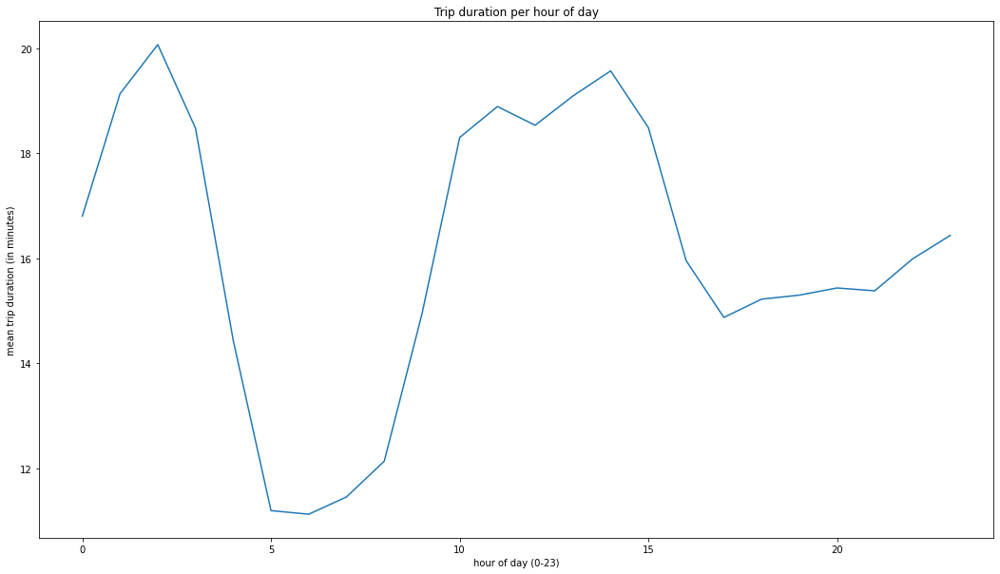

In [236]:
#plot trip duration per hour of day
plt.figure(figsize=(18,10))
plt.plot(durat_daily)
plt.xlabel('hour of day (0-23)')
plt.ylabel('mean trip duration (in minutes)')
plt.title('Trip duration per hour of day')

Longest rides take place in the morning (2-4am) and during the day (10am-3pm)

### 2.1.3 Daily Patterns

Text(0.5, 1.0, 'Departures per hour of day')

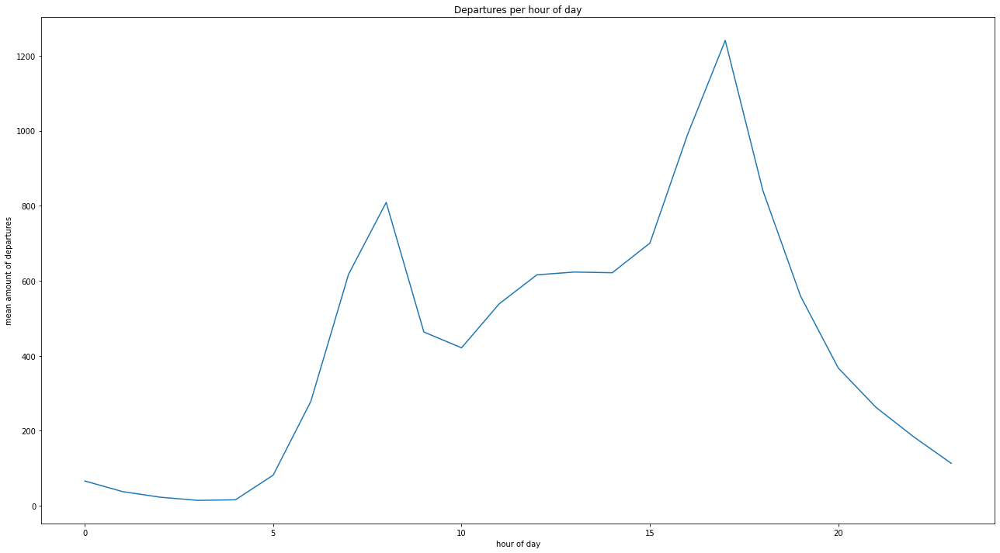

In [237]:
#avg amount trips per hour of day
trips_hourofday = filtered_df.groupby('hour_of_day').agg(trips=('trips_per_hour','mean'))
plt.figure(figsize=(22,12))
plt.plot(trips_hourofday)
plt.xlabel('hour of day')
plt.ylabel('mean amount of departures')
plt.title('Departures per hour of day')

Peak demand times are found in the morning 7-8am and afternoon (3-7pm)

In [238]:
#Departures per hour of day and weekday
trips_per_weekday = filtered_df[['trips_per_hour', 'weekday', 'hour_of_day']]

#define days of week
monday = trips_per_weekday[trips_per_weekday['weekday']==0]
tuesday = trips_per_weekday[trips_per_weekday['weekday']==1]
wednesday = trips_per_weekday[trips_per_weekday['weekday']==2]
thursday = trips_per_weekday[trips_per_weekday['weekday']==3]
friday = trips_per_weekday[trips_per_weekday['weekday']==4]
saturday = trips_per_weekday[trips_per_weekday['weekday']==5]
sunday = trips_per_weekday[trips_per_weekday['weekday']==6]

#calculate mean trips for hour of day per day of week
monday = monday.groupby('hour_of_day').agg(trips=('trips_per_hour','mean'))
tuesday = tuesday.groupby('hour_of_day').agg(trips=('trips_per_hour','mean'))
wednesday = wednesday.groupby('hour_of_day').agg(trips=('trips_per_hour','mean'))
thursday = thursday.groupby('hour_of_day').agg(trips=('trips_per_hour','mean'))
friday = friday.groupby('hour_of_day').agg(trips=('trips_per_hour','mean'))
saturday = saturday.groupby('hour_of_day').agg(trips=('trips_per_hour','mean'))
sunday = sunday.groupby('hour_of_day').agg(trips=('trips_per_hour','mean'))

Text(0.5, 1.0, 'Departures per day of week and time of day')

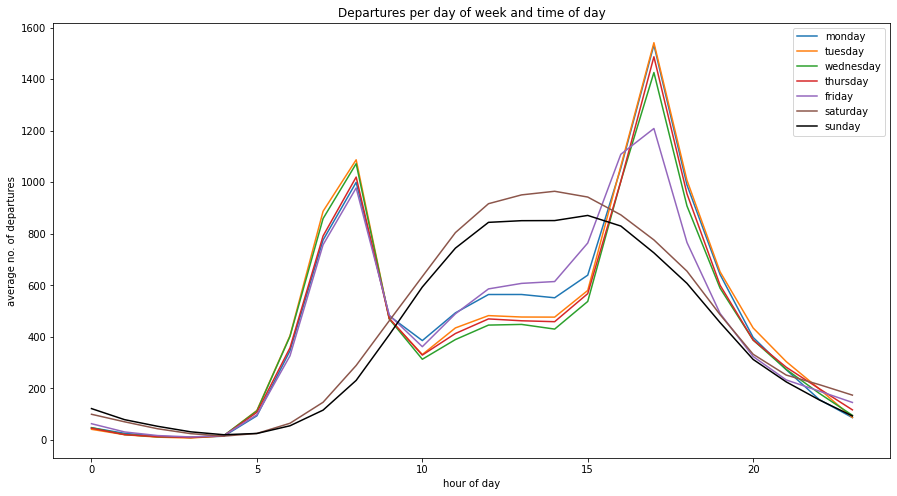

In [239]:
#plot
fig, ax = plt.subplots(figsize=(15, 8))

ax.plot(monday.index, monday['trips'], label='monday')
ax.plot(tuesday.index, tuesday['trips'],label='tuesday')
ax.plot(wednesday.index, wednesday['trips'], label ='wednesday')
ax.plot(thursday.index, thursday['trips'], label ='thursday')
ax.plot(friday.index, friday['trips'], label ='friday')
ax.plot(saturday.index, saturday['trips'], label ='saturday')
ax.plot(sunday.index, sunday['trips'], label ='sunday',c='black')

plt.xlabel('hour of day')
plt.ylabel('average no. of departures')
plt.legend(loc="best")
plt.title('Departures per day of week and time of day')

One can clearly spot the differences in departure times between weekdays and the weekend. The two spikes on weekdays (and therefore workdays) may be caused by people communting to work in the morning (5-9am) and leaving work in the afternoon (3-6pm). Over the weekend, the demand curve begins to rise much later (because no work in the morning) and peaks at around 1-4 pm, which is a popular time to visit atrractions or do other things with your free time.

### 2.1.4 Weekly Patterns

In [240]:
#create daily trips df
filtered_df['time_rounded'] = pd.to_datetime(filtered_df['time_rounded'])
filtered_df['date'] = filtered_df['time_rounded'].dt.date

daily = filtered_df.groupby('date').agg(daily_trips=("trips_per_hour","sum"))

In [241]:
# average trips per day of week

# find weekday
daily = daily.reset_index()
daily['datetime'] = pd.to_datetime(daily['date'])
daily['weekday'] = daily['datetime'].dt.weekday
daily['week'] = daily['datetime'].dt.isocalendar().week

Text(0.5, 1.0, 'Trips over the week')

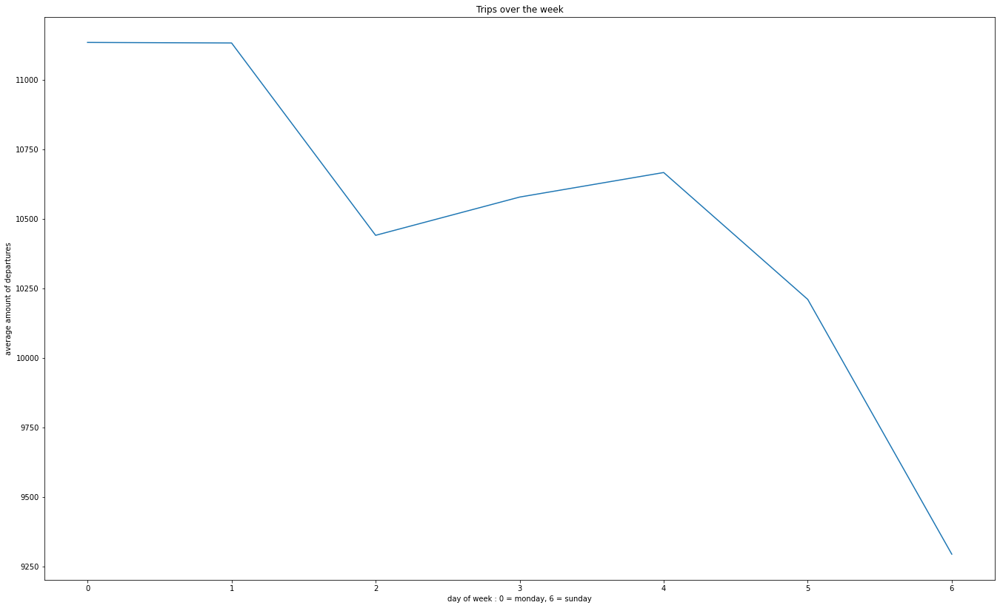

In [242]:
#plot amount of trips per weekday
day_of_week = daily.groupby('weekday').agg(weekday_trips = ("daily_trips","mean"))

plt.figure(figsize=(23,14))
plt.plot(day_of_week)
plt.xlabel('day of week : 0 = monday, 6 = sunday')
plt.ylabel('average amount of departures')
plt.title('Trips over the week')

One can spot that, on average, trips are highest at the beginning of the week (monday and tuesday) and then drop towards the weekend. As expected, usage drops on weekend to under 9.500 trips a day, sunday beeing the least popular day.

Text(0.5, 1.0, 'Trips per day of week')

<Figure size 1656x1008 with 0 Axes>

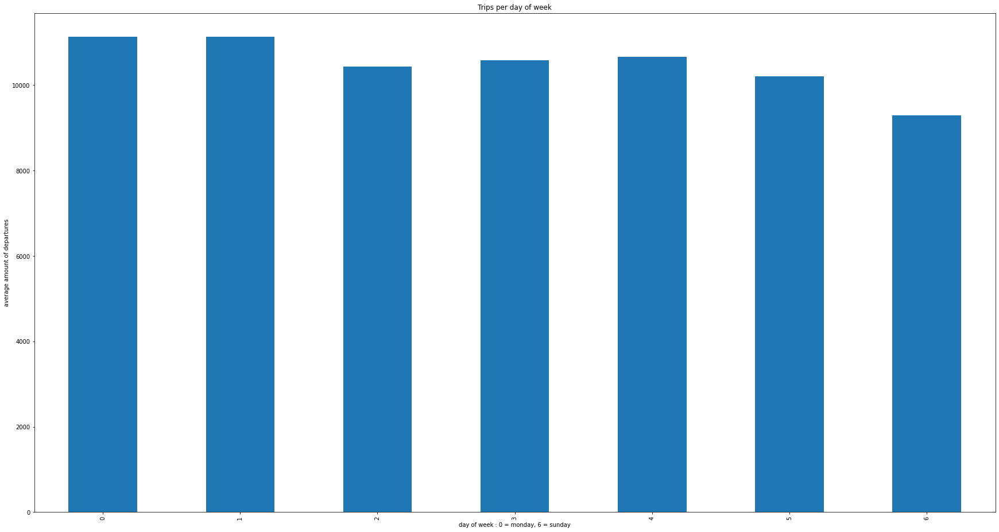

In [243]:
plt.figure(figsize=(23,14))
day_of_week.plot(kind='bar', legend=None, figsize=(30,16))
plt.xlabel('day of week : 0 = monday, 6 = sunday')
plt.ylabel('average amount of departures')
plt.title('Trips per day of week')

Average amount of trips are highest on workdays, Tuesday beeing the most busy day out of all.

### 2.1.4 Yearly/Seasonal Patterns

Text(0.5, 1.0, 'Trips per day over the year')

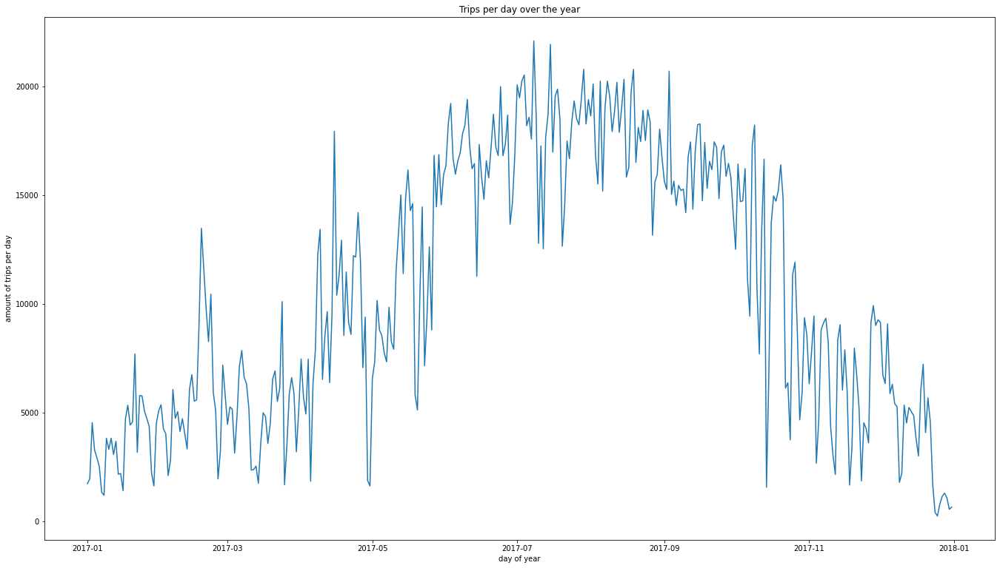

In [244]:
# Plot daily trips over year
plt.figure(figsize=(23,13))
plt.plot(daily['date'], daily['daily_trips'])
plt.xlabel('day of year')
plt.ylabel('amount of trips per day')
plt.title('Trips per day over the year')

Text(0.5, 1.0, 'Trips per week over the year')

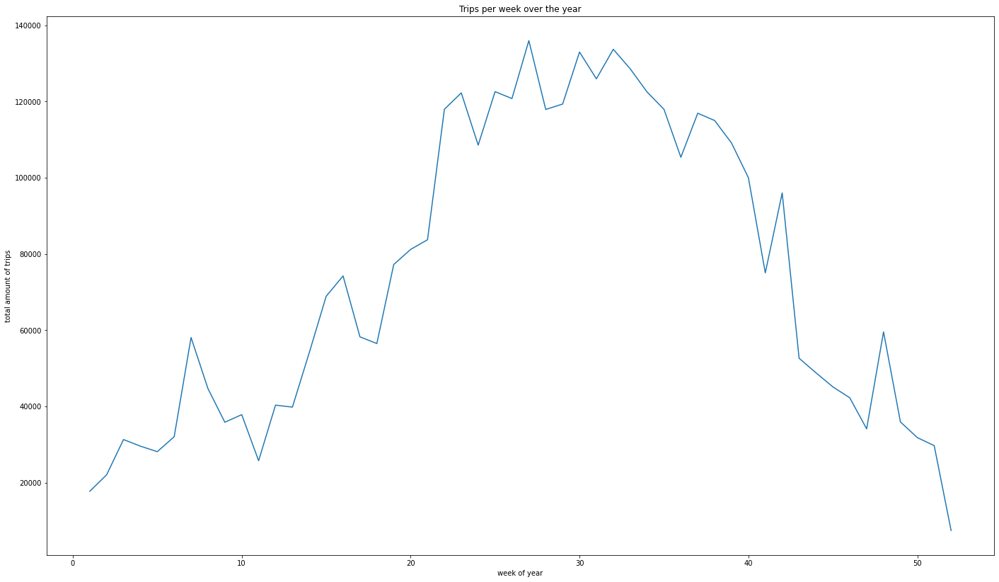

In [245]:
# create weekly df for simplification
weekly = daily.groupby('week').agg(week_total_trips = ("daily_trips", "sum"))
#plot
plt.figure(figsize=(24,14))
plt.plot(weekly)
plt.xlabel('week of year')
plt.ylabel('total amount of trips')
plt.title('Trips per week over the year')

Text(0.5, 1.0, 'Trips over the year and the 4 seasons')

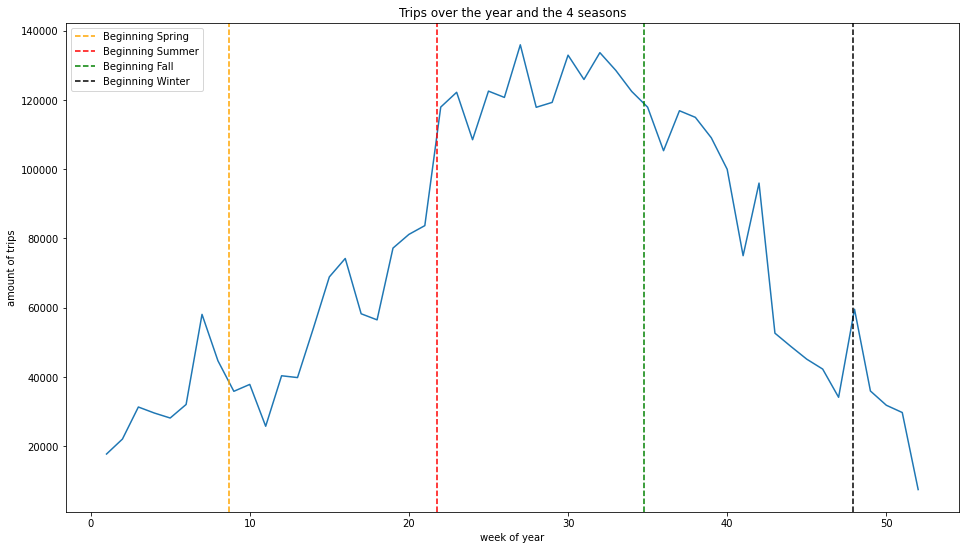

In [247]:
#mean trips are highest towards the middle of calender weeks in a year

plt.figure(figsize=(16,9))
plt.plot(weekly)

#add season marker (northern hemnisphere), Meteorological Start approximately by calendar week, to provide orientation
plt.axvline(x = 8.7, label = 'Beginning Spring', color = 'orange', linestyle = '--')
plt.axvline(x = 21.75, label = 'Beginning Summer', color = 'red', linestyle = '--')
plt.axvline(x = 34.8, label = 'Beginning Fall', color = 'green', linestyle = '--')
plt.axvline(x = 47.9, label = 'Beginning Winter', color = 'black', linestyle = '--')

plt.xlabel('week of year')
plt.ylabel('amount of trips')
plt.legend(prop = {'size':10})
plt.title('Trips over the year and the 4 seasons')

Observations: Demand is obviously highest in summer, lowest in winter. 
Note that season markers are rough estimates!

## 2.2 Geographical Demand Patterns

One can observe that no matter start or end station, there seems to be a clear popularity trend amongst the stations.

For example, as seen below, 'Streeter Dr & Grand Ave' station is the Navy Pier, one of the most popular tourist attractions in the city of Chicago.

However, other stations such as 'Ashland Ave & 66th St' seem to have been used only a few times

In [248]:
# calculate counts per unique start station
chicago_data['start_station_name'].value_counts()

Streeter Dr & Grand Ave         97571
Lake Shore Dr & Monroe St       53400
Canal St & Adams St             50911
Clinton St & Washington Blvd    49832
Theater on the Lake             47906
                                ...  
Throop St & 52nd St                 9
Seeley Ave & Garfield Blvd          8
Vernon Ave & 79th St                6
Ashland Ave & 66th St               4
Phillips Ave & 82nd St              3
Name: start_station_name, Length: 593, dtype: int64

In [249]:
# calculate counts per unique end station
chicago_data['end_station_name'].value_counts()

Streeter Dr & Grand Ave        106023
Lake Shore Dr & North Blvd      53091
Canal St & Adams St             52608
Theater on the Lake             50779
Clinton St & Madison St         50298
                                ...  
Ashland Ave & Garfield Blvd         8
Throop St & 52nd St                 5
Ashland Ave & 66th St               4
Vernon Ave & 79th St                4
Phillips Ave & 82nd St              2
Name: end_station_name, Length: 593, dtype: int64

### 2.2.1 Import shapefiles and location data

Source: https://data.cityofchicago.org

In [250]:
#import chicago streets shapefile
streets = gpd.read_file('/Users/Lukas/Downloads/Street_center_lines/geo_export_5be3973d-042a-4557-ace5-cf6a567ad6e0.shp')

In [251]:
#import districts shapefile
districts = gpd.read_file('/Users/Lukas/Downloads/Boundaries - Community Areas (current)-2/geo_export_5e9bdce9-952c-4fb4-85ea-cebefa5c92ef.shp')

In [252]:
#import Divvy stations location data (retrived online)
stations = pd.read_csv('/Users/Lukas/Downloads/Divvy_Bicycle_Stations_-_All_-_Map.csv')

### 2.2.2 Preparation

In [253]:
#get geo Data by using Point and long, lat information
geometry = [Point (xy) for xy in zip(stations['Longitude'], stations['Latitude'])]

In [254]:
#create geodataframe with stations and their geometry we just calculated
stations_geo = gpd.GeoDataFrame(stations, geometry = geometry)

In [255]:
# lets merge dataframes on Divvy start station Id
chicago_geo = pd.merge(chicago_data,stations_geo,left_on=['start_station_id'], right_on = ['ID'], how = 'left') 

# on end station aswell
chicago_geo = pd.merge(chicago_geo,stations_geo,left_on=['end_station_id'], right_on = ['ID'], how = 'left')

In [256]:
#drop NaNs
chicago_geo = chicago_geo.dropna(axis=0, how="any")

In [257]:
# add distance between start and end station based on location
def distancer(row):
    coords_1 = (row['Latitude_x'], row['Longitude_x'])
    coords_2 = (row['Latitude_y'], row['Longitude_y'])
    return geopy.distance.distance(coords_1, coords_2).km

#apply distancer
chicago_geo['distance_travelled'] = chicago_geo.apply(distancer, axis=1)

### 2.2.3 Divvy Stations in Chicago

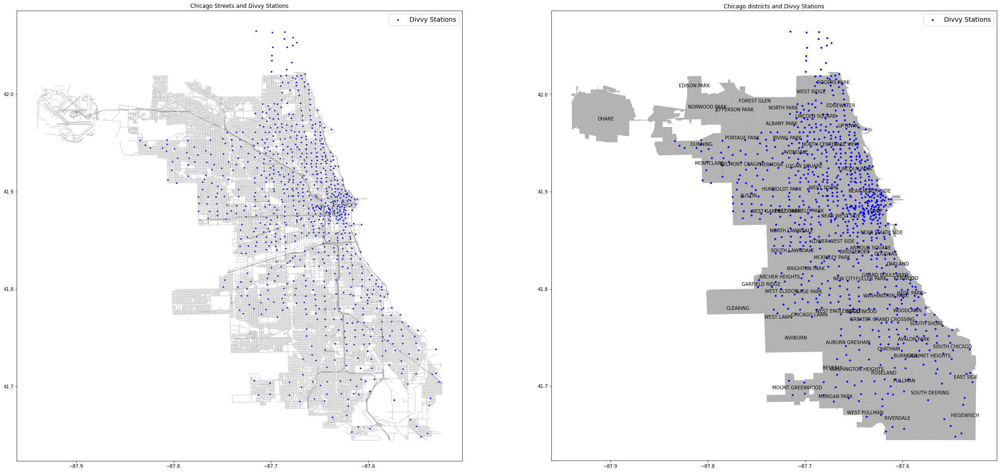

In [258]:
#plot of Divvy stations on chicago street shapefile
fig, ax = plt.subplots(1,2,figsize = (38,24))

streets.plot(ax = ax[0], alpha=0.3, color= 'grey')
stations_geo.plot(ax = ax[0], marker='o', markersize = 6, color='blue', label = 'Divvy Stations', legend = True)
ax[0].set_title('Chicago Streets and Divvy Stations')
ax[0].legend(prop = {'size':14})

#find random coordinate in Polygon to position district label later on
districts['coords'] = districts['geometry'].apply(lambda x: x.representative_point().coords[:])
districts['coords'] = [coords[0] for coords in districts['coords']]  

#plot stations against city districts
districts.plot(ax = ax[1], alpha=0.6, color= 'grey')
stations_geo.plot(ax = ax[1], marker='o', markersize = 10, color='blue', label = 'Divvy Stations', legend = True)
ax[1].set_title('Chicago districts and Divvy Stations')
ax[1].legend(prop = {'size':14})

#annotate community name for every district at estimated coords
for index, row in districts.iterrows():
    plt.annotate(s=row['community'], xy=row['coords'],
                 horizontalalignment='center', fontsize='10', color='black')

Observations: Divvy stations are clearly concentrated towards the city centre and the lakeside (east).

Part of the shapefile in the north seems to be missing, the missing district is called 'Evanston'.

The highest concentration of Divvy Stations is found in the districts 'Near North Side', 'Loop', 'Near South Side', 'Lincoln Park', 'Lake View', etc.
This makes sense considering lake michigan is located to the east of the above map. The lakeside includes multiple beaches, the navy pier, multiple museums, tourist attractions and of course provides for a beautiful skyline.

In [259]:
# over 250 station ids seem to not have been used once as starting point
stations['ID'].nunique() - chicago_data['start_station_id'].nunique()

250

The question has to be raised for management: Is it worth funding these stations anymore? 
(Note: We dont know how many stations are still active, because data might be outdated)

### 2.2.4 Heatmap of Activity

We manually researched and added coordinates of important points in Chicago in order to better understand demand.

In [260]:
#find coordinates of attractions
attractions = [{'Name': 'Navy Pier',
                "Longitude" :-87.610168,
                "Latitude":41.892654}, #Navy Pier
               {'Name': 'University of Chicago',
                "Longitude" :-87.599724,
                "Latitude":41.789722}, #University of Chicago
               {'Name': 'University of Illinois at Chicago',
                "Longitude":-87.64925,
                'Latitude': 41.871889},#University of Illinois at Chicago
               {'Name': 'Soho House',
                "Longitude": -87.648307,
                'Latitude': 41.88374},#Soho House
               {'Name': 'Presidential Towers',
                "Longitude": -87.6426838,
                'Latitude': 41.8814362},#Presidential Towers
               {'Name': 'Chicago Theatre',
                "Longitude": -87.627569,
                'Latitude': 41.885485},# Chicago Theatre
               {'Name': 'Art Institute',
                "Longitude": -87.620997516,
                'Latitude': 41.874329836},# Art Institute
                {'Name': 'Montrose Beach',
                "Longitude": -87.637233,
                'Latitude': 41.966331},#Montrose Beach
               {'Name': 'Field Museum of National History',
                "Longitude": -87.617020,
                'Latitude': 41.864193},#Field Museum of National History
               {'Name': 'Museum of Contemporary Art',
                "Longitude": -87.621474,
                'Latitude': 41.897215 },#Museum of Contemporary Art
               {'Name': 'Cloud Gate',
                "Longitude": -87.620659184,
                'Latitude': 41.8762748282 },#Cloud Gate
               {'Name': 'Willis Tower (SkyDeck)',
                "Longitude": -87.635943,
                'Latitude': 41.878741}]#Willis Tower (SkyDeck)

# load into dataframe
attractions1 = pd.DataFrame(attractions, index = [1,2,3,4,5,6,7,8,9,10,11,12])

#calculate Point data for attractions
geometry_attrac = [Point (xy) for xy in zip(attractions1['Longitude'], attractions1['Latitude'])]

#create Geodataframe 
attrac = gpd.GeoDataFrame(attractions1, crs={"init":"epsg:4326"}, geometry = geometry_attrac)

Basic heatmap function for both start and end stations:

In [261]:
#plot

def plot_heatmap(df):
    fig, ax = plt.subplots(1,2,figsize = (35,25))

    #departures
    attrac.plot(ax = ax[0], marker = 'o', markersize=180,  zorder=7, column = 'Name', legend=True, cmap='gist_ncar')
    sns.kdeplot(ax = ax[0],
              data = df,
                 x = 'Longitude_x', 
                 y = 'Latitude_x', 
              fill = True, 
          gridsize = 100,
            levels = 9,
             shade = True,
              cmap = "hot",
             alpha = 0.65)

    ctx.add_basemap(ax = ax[0], crs = 4326, alpha = 0.8, zoom = 14)
    stations_geo.plot(ax = ax[0], marker='o', markersize = 10, color='blue')
    
    #arivals
    attrac.plot(ax = ax[1], marker = 'o', markersize=180,  zorder=7, column = 'Name', legend=True, cmap='gist_ncar')
    sns.kdeplot(ax = ax[1],
              data = df,
                 x = 'Longitude_y', 
                 y = 'Latitude_y', 
              fill = True, 
          gridsize = 100,
            levels = 9,
             shade = True,
              cmap = "hot",
             alpha = 0.65)

    ctx.add_basemap(ax = ax[1], crs = 4326, alpha = 0.8, zoom = 14)
    stations_geo.plot(ax = ax[1], marker='o', markersize = 10, color='blue')

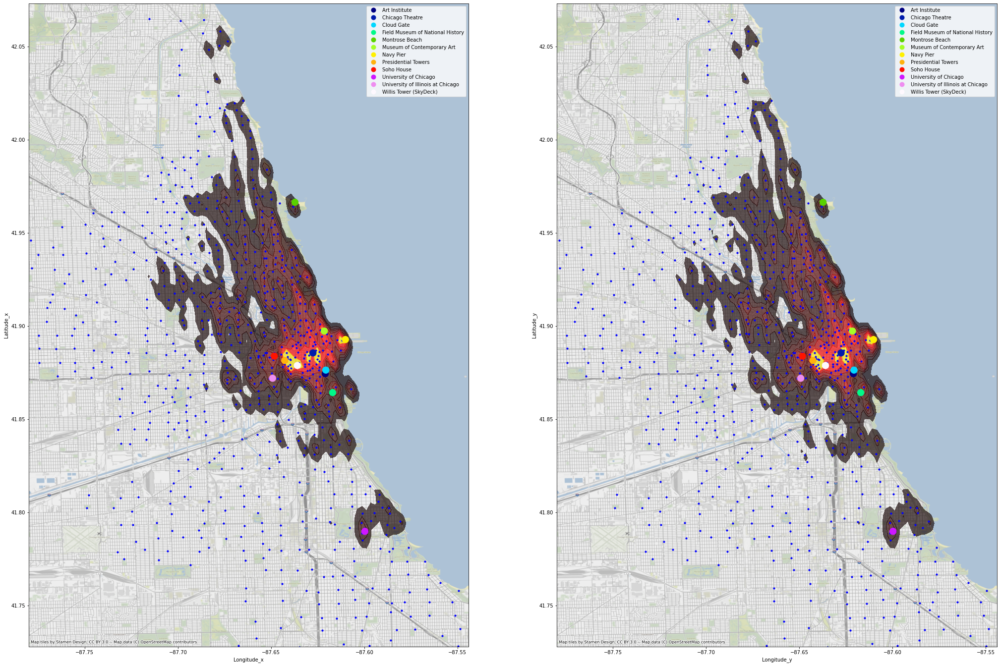

In [262]:
#plot departure and arrival heatmap
plot_heatmap(chicago_geo)

Let's look at weekends and weekdays seperately:

In [263]:
heatmap_workdays = chicago_geo[chicago_geo.weekday.isin([0,1,2,3,4])]
heatmap_weekend = chicago_geo[chicago_geo.weekday.isin([5,6])]

#### Weekdays Departures vs. Arrivals Heatmap

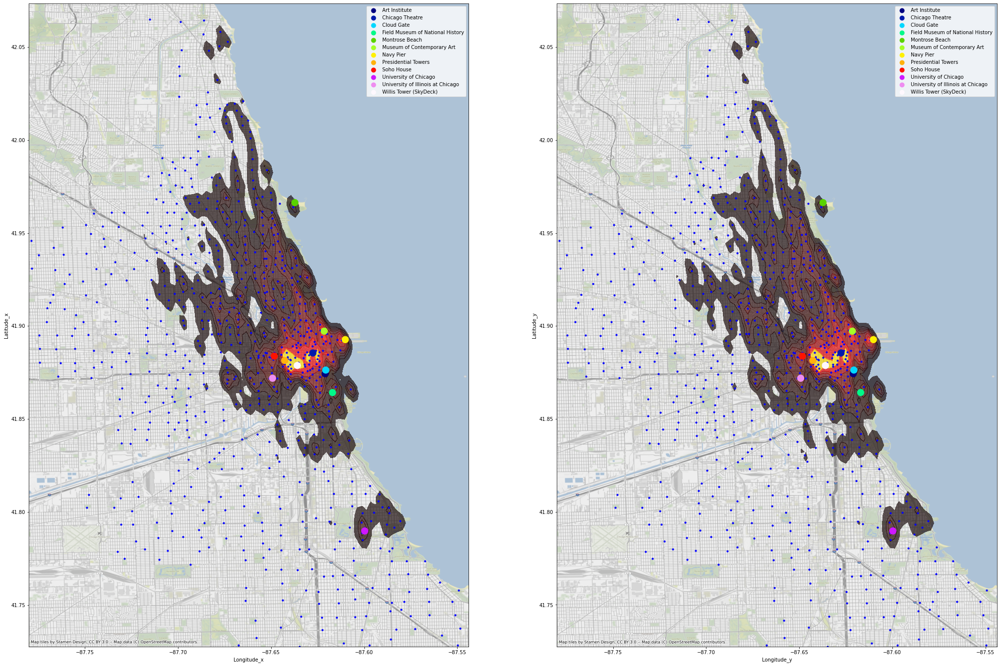

In [264]:
#plot weekdays
plot_heatmap(heatmap_workdays)

On weekdays, demand seems to concentrate more towards the inner city centre, especially Presidential Towers and Willis Tower (which is currently the tallest building in Chicago, third-tallest building in the United Statesand also contains ca. 350.000 m² of office space), indicating work commuting.

#### Weekend Departures vs. Arrivals Heatmap

In [ ]:
#plot weekends
plot_heatmap(heatmap_weekend)

On the weekend, the city center along the lake seems to be very popular. Points of interest are the Navy Pier, Museum of temporary art, theatre and montrose beach – all popular weekend destinations.

#### Sequencing

Let's look at different time sequences of the day:

In [ ]:
#transform time
heatmap_workdays['time'] = heatmap_workdays['start'].dt.time
heatmap_workdays['time'] = heatmap_workdays['time'].astype(str)
heatmap_workdays['time'] = pd.to_timedelta(heatmap_workdays['time']).dt.total_seconds()
heatmap_workdays['time'] = heatmap_workdays['time']/60/60

In [ ]:
#split function
def plot_heatmap_split(df,splits):
    slice_size = 24/splits
    fig, axes = plt.subplots(2,splits,figsize=(20,14))
    fig.suptitle('Chicago: Start and End Areas on weekdays', fontsize=20)

    i = 0
    
    #do until i = no. of splits 
    while i < splits:
        #calculate times
        min_time = i*slice_size
        max_time = (i+1)*slice_size - 1
        # filter for specific time of day
        df_split = df[(df['time']>=min_time) & (df['time']<=max_time)]

        u=0
        while u<2:
            
            #row Start Point, End Point
            lng = 'Longitude_x'
            lat = 'Latitude_x'
            if u ==1: 
                lng = 'Longitude_y'
                lat = 'Latitude_y'
            
        
            #plotting as a heatmap
            sns.kdeplot(x=df_split[lng], 
                        y=df_split[lat],
                        shade=True, 
                        thresh=0.1,
                        alpha = 0.65,
                        cmap='hot',
                        ax=axes[u,i]) 
            
            #base map from contextily
            ctx.add_basemap(ax=axes[u,i],crs=4326,alpha=0.8)
            
            
            #increase by one
            u = u + 1
        
        axes[0,i].set_title(str(int(min_time))+' to '+str(int(max_time))+' o" Clock')
        
        #increase by one
        i = i + 1 

In [ ]:
#use function, divide day into 4 time intervals
plot_heatmap_split(df=heatmap_workdays,splits=4)

## 2.3 Key Performance Indicators

##### KPI1 => Average trip duration per day
Our first KPI is the average trip duration per day as we assume that this will differ in the year

Text(0.5, 0.98, 'trip duration per day (mean)')

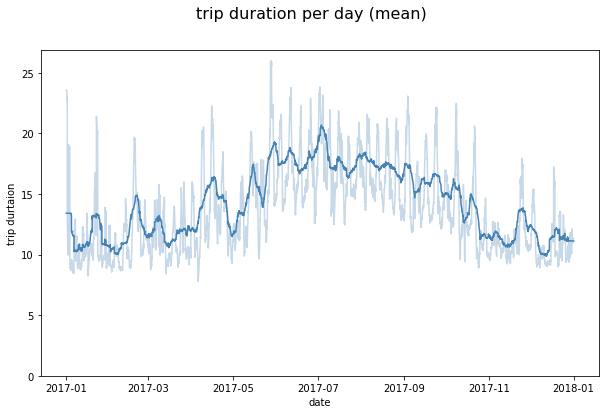

In [29]:
kpi_01 = chicago_data.groupby(['time_rounded']).agg(
        rental_count=("start_time","count"),
        mean_trip_duration=("trip_duration_minutes","mean")
)

kpi_01['rental_count_ma'] = moving_average(kpi_01["rental_count"],24*7)
kpi_01['rental_count_ma_neu'] = moving_average(kpi_01["rental_count"],24)
kpi_01['mean_trip_duration_ma'] = moving_average(kpi_01["mean_trip_duration"],24*7)
kpi_01['mean_trip_duration_ma_neu'] = moving_average(kpi_01["mean_trip_duration"],24)

fig,axis = plt.subplots(1,1,figsize=(10,6))

axis.plot(kpi_01.index, kpi_01['mean_trip_duration_ma_neu'],c="steelblue",alpha = 0.3)
axis.plot(kpi_01.index, kpi_01['mean_trip_duration_ma'],c="steelblue")

axis.set_ylim(bottom=0)
plt.xlabel('date')
plt.ylabel('trip durtaion')
fig.suptitle("trip duration per day (mean)", fontsize=16)

#### KPI2 => Rentals per day 

Text(0.5, 0.98, 'Rentals per day')

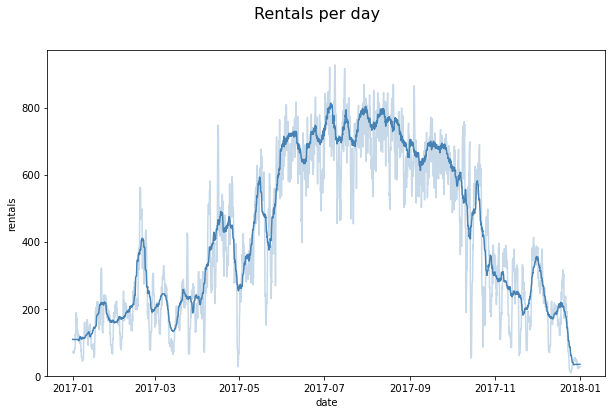

In [30]:
fig,axis = plt.subplots(1,1,figsize=(10,6))

axis.plot(kpi_01.index, kpi_01['rental_count_ma_neu'],c="steelblue",alpha = 0.3)
axis.plot(kpi_01.index, kpi_01['rental_count_ma'],c="steelblue")

axis.set_ylim(bottom=0)
plt.xlabel('date')
plt.ylabel('rentals')
fig.suptitle("Rentals per day", fontsize=16)

#### KPI3 => Fleet size

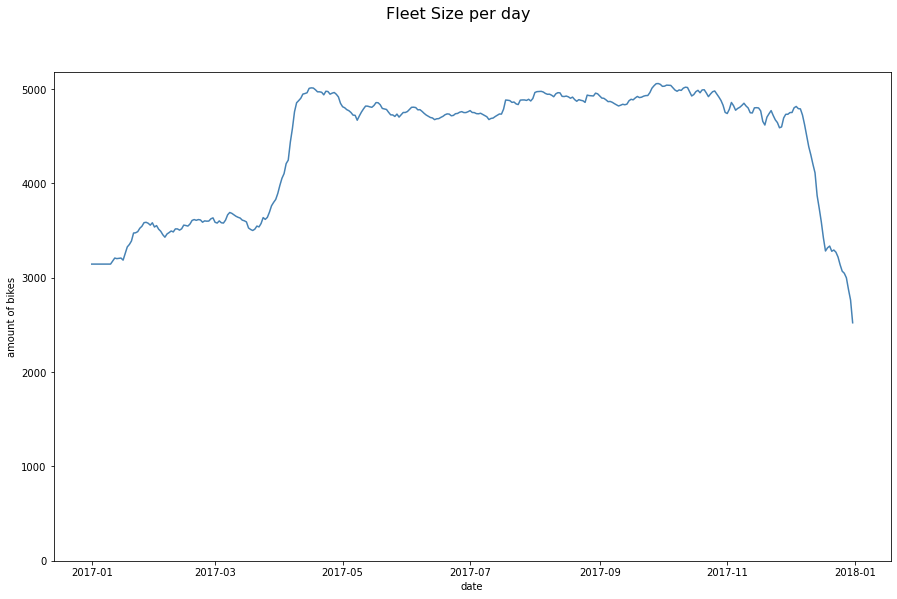

In [31]:
fig,axis = plt.subplots(1,1,figsize=(15,9))
fleet_size = fleet_size(chicago_data, 10)

_=axis.plot(fleet_size.index,(fleet_size["fleet_size"]),c="steelblue")

axis.set_ylim(bottom=0)

plt.xlabel('date')
plt.ylabel('amount of bikes')
_=fig.suptitle("Fleet Size per day", fontsize=16)

#### KPI4 => Customer types per day
As we have subscriber and customers as a renter type we want to know how much rentals will done per day from which renter type.

Text(0.5, 0.98, 'Customer types per day')

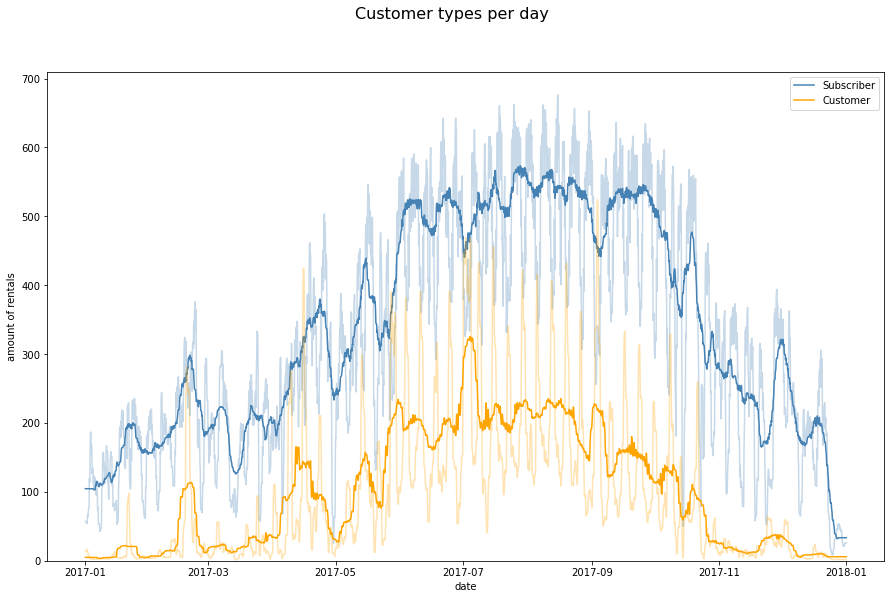

In [32]:
kpi_05_sub = chicago_data[chicago_data['user_type']=='Subscriber'].groupby(['time_rounded']).agg(
        rental_count=("start_time","count")
)
kpi_05_cus = chicago_data[chicago_data['user_type']=='Customer'].groupby(['time_rounded']).agg(
        rental_count=("start_time","count")
)

kpi_05_sub['rental_count_ma'] = moving_average(kpi_05_sub["rental_count"],7*24)
kpi_05_sub['rental_count_ma_neu'] = moving_average(kpi_05_sub["rental_count"],24)
kpi_05_cus['rental_count_ma'] = moving_average(kpi_05_cus["rental_count"],7*24)
kpi_05_cus['rental_count_ma_neu'] = moving_average(kpi_05_cus["rental_count"],24)

fig,axis = plt.subplots(1,1,figsize=(15,9))

axis.plot(kpi_05_sub.index, kpi_05_sub['rental_count_ma_neu'],c="steelblue",alpha = 0.3)
axis.plot(kpi_05_sub.index, kpi_05_sub['rental_count_ma'],c="steelblue", label="Subscriber")

axis.plot(kpi_05_cus.index, kpi_05_cus['rental_count_ma_neu'],c="orange",alpha = 0.3)
axis.plot(kpi_05_cus.index, kpi_05_cus['rental_count_ma'],c="orange", label="Customer")

axis.set_ylim(bottom=0)
axis.legend()
plt.xlabel('date')
plt.ylabel('amount of rentals')
fig.suptitle("Customer types per day", fontsize=16)

# 3. Cluster Analysis

## 3.1 Customer/Trip Type Clustering

Based on the bike rental demand patterns (high weekday demand, peak demand at specific times of day) found earlier, we try to find clusters of trip/customer types.

In [ ]:
chicago_geo.sort_values(by=['start_time'], inplace=True)

#### Cluster 1:  Trip duration vs. distance travelled

In [ ]:
#create df
cluster_1 = chicago_geo[['trip_duration', 'distance_travelled', 'weekday']]
#change timedelta to int
cluster_1['trip_duration'] = cluster_1['trip_duration'].dt.seconds/60

In [ ]:
#select workdays
cluster_1 = cluster_1[cluster_1.weekday.isin([0,1,2,3,4])]

In [ ]:
cluster_1.drop('weekday', axis=1, inplace=True)
cluster_1.dropna(inplace=True)

In [ ]:
#initiate standard scaler from sklearn
st_scaler = StandardScaler()

In [ ]:
#Scale data
st_scaler.fit(cluster_1)
scaled_cluster = st_scaler.transform(cluster_1)

Apply Elbow method to find optimal number of clusters:

In [ ]:
#args
kmeans_kwargs = {
            "init": "random",
            "n_init": 10,
            "max_iter": 300,
            "random_state": 42,
             }
# A list holds the SSE values for each k
sse = []
#test different k values and record sse
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_cluster)
    sse.append(kmeans.inertia_)

In [ ]:
#plot sse
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")

In [ ]:
#fit and predict clusters 
kmeans = KMeans(n_clusters=3)
labels = kmeans.fit_predict(scaled_cluster)

In [ ]:
#plot clusters and histogram
fig,ax=plt.subplots(1,2,figsize=(25,12))

ax[0].scatter(x=cluster_1['trip_duration'],y=cluster_1['distance_travelled'],c=labels,alpha=0.05)

ax[1].hist2d(cluster_1['trip_duration'],
            cluster_1['distance_travelled'],
            bins=59, cmap="Blues")

ax[0].set_title("Clusters")
ax[1].set_title("Histogram")

ax[0].set_ylabel('distance travelled')
ax[0].set_xlabel('trip duration')


ax[1].set_ylabel("distance travelled")
ax[1].set_xlabel("trip duration")

#### Cluster 2: Let's compare trip distance vs. start time

In [ ]:
cluster_2 = chicago_geo[['start', 'distance_travelled','weekday']]

cluster_2['start'] = cluster_2['start'].dt.time
cluster_2['start'] = cluster_2['start'].astype(str)

cluster_2['start'] = pd.to_timedelta(cluster_2['start']).dt.total_seconds()
cluster_2['start'] = cluster_2['start']/60/60

In [ ]:
#select workdays
cluster_2 = cluster_2[cluster_2.weekday.isin([0,1,2,3,4])]

In [ ]:
cluster_2.drop('weekday', axis=1, inplace=True)
cluster_2.dropna(inplace=True)

In [ ]:
#Scale data

st_scaler.fit(cluster_2)
scaled_cluster = st_scaler.transform(cluster_2)

#args
kmeans_kwargs = {
            "init": "random",
            "n_init": 10,
            "max_iter": 300,
            "random_state": 42,
             }
# A list holds the SSE values for each k
sse = []
#test different k values and record sse
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_cluster)
    sse.append(kmeans.inertia_)
    
#plot sse
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")

#initiate
kmeans = KMeans(n_clusters=3)
labels = kmeans.fit_predict(scaled_cluster)

fig,ax=plt.subplots(1,2,figsize=(25,12))

ax[0].scatter(x=cluster_2['start'],y=cluster_2['distance_travelled'],c=labels,alpha=0.05)

ax[1].hist2d(cluster_2['start'],
            cluster_2['distance_travelled'],
            bins=59, cmap="Blues")

ax[0].set_title("Clusters")
ax[1].set_title("Histogram")

ax[0].set_ylabel('distance')
ax[0].set_xlabel('time')


ax[1].set_ylabel("distance")
ax[1].set_xlabel("time")

#### Cluster 3: Let's compare trip duration and start time

In [ ]:
#create df
cluster_3 = chicago_geo[['trip_duration', 'start', 'weekday']]
#change timedelta to int
cluster_3['trip_duration'] = cluster_3['trip_duration'].dt.seconds/60

In [ ]:
#select workdays
cluster_3 = cluster_3[cluster_3.weekday.isin([0,1,2,3,4])]

In [ ]:
cluster_3.drop('weekday', axis=1, inplace=True)
cluster_3.dropna(inplace=True)

In [ ]:
cluster_3['start'] = cluster_3['start'].dt.time
cluster_3['start'] = cluster_3['start'].astype(str)

cluster_3['start'] = pd.to_timedelta(cluster_3['start']).dt.total_seconds()
cluster_3['start'] = cluster_3['start']/60/60

In [ ]:
#Scale data
st_scaler.fit(cluster_3)
scaled_cluster = st_scaler.transform(cluster_3)

#args
kmeans_kwargs = {
            "init": "random",
            "n_init": 10,
            "max_iter": 300,
            "random_state": 42,
             }
# A list holds the SSE values for each k
sse = []
#test different k values and record sse
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_cluster)
    sse.append(kmeans.inertia_)
    
#plot sse
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")

#initiate
kmeans = KMeans(n_clusters=3)
labels = kmeans.fit_predict(scaled_cluster)

fig,ax=plt.subplots(1,2,figsize=(25,12))

ax[0].scatter(x=cluster_3['start'],y=cluster_3['trip_duration'],c=labels,alpha=0.05)

ax[1].hist2d(cluster_3['start'],
            cluster_3['trip_duration'],
            bins=59, cmap="Blues")

ax[0].set_title("Clusters")
ax[1].set_title("Histogram")

ax[0].set_ylabel('duration')
ax[0].set_xlabel('start time')


ax[1].set_ylabel("duration")
ax[1].set_xlabel("start time")

#### Cluster 4:

Now finally, let's try a multi dimesional cluster analysis in order to identify possible customer/trip types:

In [ ]:
cluster_4 = chicago_geo[['trip_duration', 'start', 'distance_travelled', 'weekday']]
#change timedelta to int
cluster_4['trip_duration'] = cluster_4['trip_duration'].dt.seconds/60


#select workdays
cluster_4 = cluster_4[cluster_4.weekday.isin([0,1,2,3,4])]

cluster_4.drop('weekday', axis=1, inplace=True)

cluster_4.dropna(inplace=True)

cluster_4['start'] = cluster_4['start'].dt.time
cluster_4['start'] = cluster_4['start'].astype(str)

cluster_4['start'] = pd.to_timedelta(cluster_4['start']).dt.total_seconds()
cluster_4['start'] = cluster_4['start']/60/60

In [ ]:
#Scale data
st_scaler.fit(cluster_4)
scaled_cluster = st_scaler.transform(cluster_4)

#args
kmeans_kwargs = {
            "init": "random",
            "n_init": 10,
            "max_iter": 300,
            "random_state": 42,
             }
# A list holds the SSE values for each k
sse = []
#test different k values and record sse
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_cluster)
    sse.append(kmeans.inertia_)
    
#plot sse
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")

In [ ]:
# finding the clusters based on input matrix
kmeans = KMeans(n_clusters=4)
labels = kmeans.fit_predict(scaled_cluster)

In [ ]:
#plot
fig = plt.figure(figsize = (20,20))

#first 3d plot
ax = fig.add_subplot(1, 2, 1, projection='3d')

ax.scatter(cluster_4['start'],cluster_4['trip_duration'],cluster_4['distance_travelled'],c=labels, s=20, alpha=0.05)
ax.set_xlabel('start')
ax.set_ylabel('duration')
ax.set_zlabel('distance')
ax.view_init(20, -150)

#second 3d plot (rotated for better undesrstanding)
ax = fig.add_subplot(1, 2, 2, projection='3d')

ax.scatter(cluster_4['start'],cluster_4['trip_duration'],cluster_4['distance_travelled'],c=labels, s=20, alpha=0.05)
ax.set_xlabel('start')
ax.set_ylabel('duration')
ax.set_zlabel('distance')
ax.view_init(20, 150)

#### Trip Type Clusters:

Trip Type 1 (in purple): Long distance trips with relatively medium to high speed. No specific characteristic of departure time.

Trip type 2 (in green): Evening short trips with moderate speed.

Trip type 3 (in blue): Morning short trips with moderate speed.

Trip Type 4 (in yellow): Short distance trips with long duration. Preferably in the afternoon.

#### Implications and business recommendations: 

-Determination of appropriate product pricing: Pricing at peak demand times could be raised/Lower price for long distance/duration trips in order to maximize fleet usage.

-Development of customized marketing campaigns: Groups could be adressed individually by utilizing user stories and customer journeys to find needs. E.g. you could run a campaign aimed towards trip type 4 (very relaxed driving, afternoon shots of sun etc.)

-Development of specific services 

# 4. Predictive Analytics

Create dataframe containing all features:

In [ ]:
#merge datasets on datetime64 time columns
chicago_final = pd.merge(filtered_df,weather_data,left_on=['time_rounded'], right_on = ['index'], how = 'left')

## 4.1 Feature Engineering

##### We have multiple feature characteristics: 
1. Characteristic Extraction of Weather Data 

2. Time characteristics 

3. Information Characteristics

###  Feature Selection

Let's check the correlation of variables with the dependent variable trips per hour.

We know that the best features have a high correlation with the target value!

In [162]:
chicago_final = chicago_final.dropna(axis=0, how="any")

<AxesSubplot:>

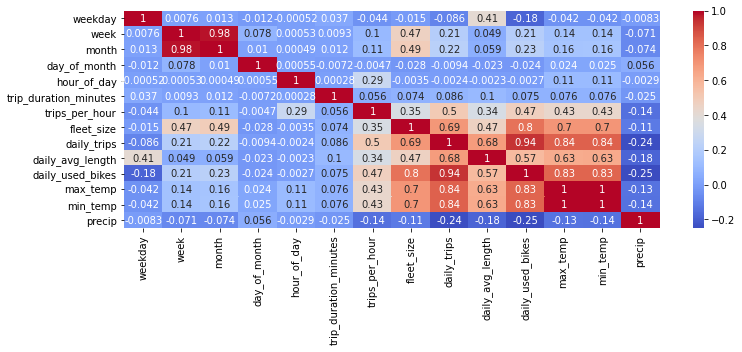

In [163]:
#plot feature correlations heatmap
fig,ax  = plt.subplots(figsize=(12,4))
sns.heatmap(chicago_final.corr(), annot=True,cmap ="coolwarm",ax=ax)

A lot of variables seem to be show only very small correlation with the target variable. Also some variables such as max and min tempereature more or less mean the same thing. As a conclusion, let's drop those variables.

In [164]:
# drop columns not needed for next steps
#as you can see, max and min temp per hour correlate by 1, so we delete min_temp also
chicago_final = chicago_final.drop(columns=['daily_used_bikes','precip','week','day_of_month', 'weekday','user_type','date','month','trip_duration', 'trip_duration_minutes','min_temp','start_time', 'end_time', 'start', 'end', 'index'])

In [165]:
chicago_final = chicago_final.set_index('time_rounded')
#sort by index 
chicago_final.sort_index(inplace=True)

<AxesSubplot:>

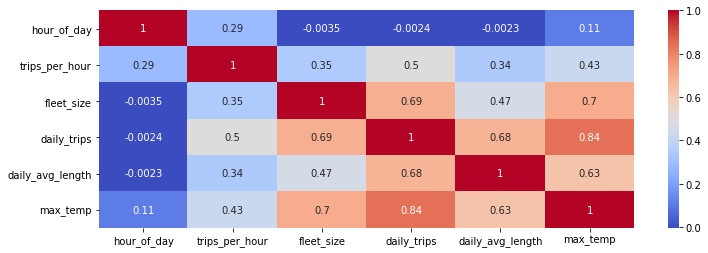

In [166]:
#check correlation again
fig,ax  = plt.subplots(figsize=(12,4))
sns.heatmap(chicago_final.corr(), annot=True,cmap ="coolwarm",ax=ax)

## 4.2 Model Building

For the prediction task at hand, we chose the following three regression models:

1. Multiple Linear Regression
2. Tree Regression
3. ARIMA (Auto-Regressive Integrated Moving Average)

#### Cross-Validation:

In [167]:
#Cross validation
X = chicago_final.drop(columns=["trips_per_hour"])
Y = chicago_final[["trips_per_hour"]]

#normalize
X_c = min_max_scaling(X)

#split
X_train, X_test, y_train, y_test = train_test_split(X_c, Y,test_size = 0.3,random_state = 2)


### 4.2.1 Descision Tree and Linear Regression

In [168]:
# Decision tree regressor
Tree_reg = DecisionTreeRegressor(min_samples_leaf=10,criterion="mse")
Tree_reg.fit(X_train, y_train)
Tree_reg_pred = Tree_reg.predict(X_test)

r2_tree = r2_score(y_test, Tree_reg_pred)

# Linear regression
lin_reg = LinearRegression(normalize=True)
lin_reg.fit(X_train, y_train)
lin_reg_pred = lin_reg.predict(X_test)
    
r2_mr = r2_score(y_test, lin_reg_pred)

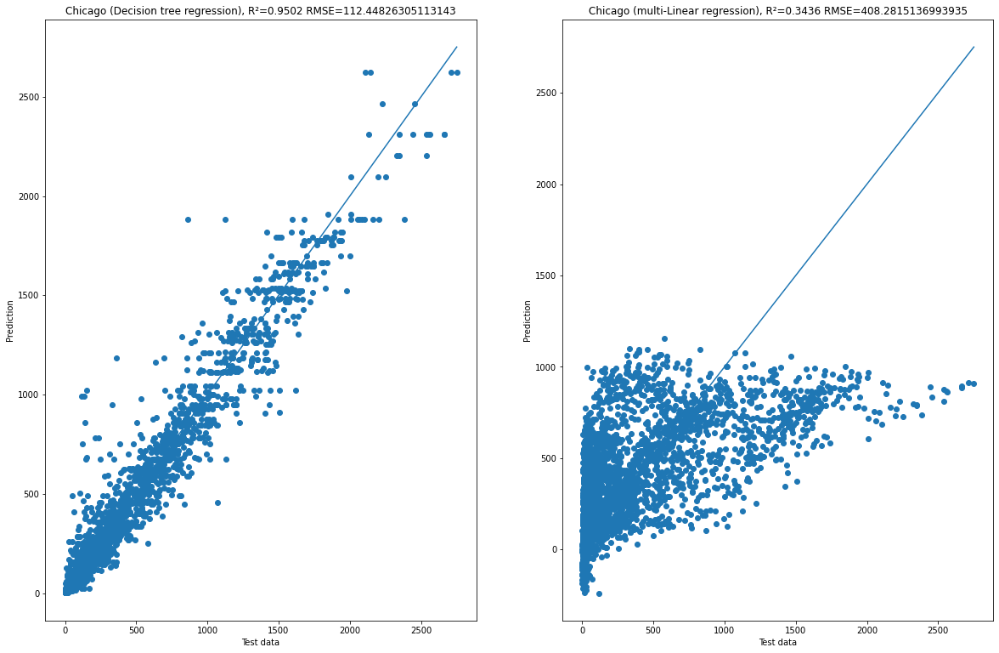

In [175]:
fig, axes = plt.subplots(1,2,figsize = (20,13))

axes[0].scatter(y_test, Tree_reg_pred)
axes[0].set_title("Chicago (Decision tree regression), R²="+
                  str(round(r2_tree,4))+" RMSE="+
                  str(np.sqrt(mean_squared_error(y_test, Tree_reg_pred))))
max=y_test.max()["trips_per_hour"]
x = np.linspace(0, max)
axes[0].set_ylabel('Prediction')
axes[0].set_xlabel('Test data')
axes[0].plot(x,x)

axes[1].scatter(y_test, lin_reg_pred)
axes[1].set_title("Chicago (multi-Linear regression), R²="+
                  str(round(r2_mr,4))+" RMSE="+
                  str(np.sqrt(mean_squared_error(y_test, lin_reg_pred))))
max=y_test.max()["trips_per_hour"]
x = np.linspace(0, max)
axes[1].set_ylabel('Prediction')
axes[1].set_xlabel('Test data')
axes[1].plot(x,x)

#### Decision Tree Regression

With an R squared of over .95 and an RMSE of 112, this regression seems to earn quite reasonable results.

#### Multiple Linear Regression (MLR)

Slope coefficients for each explanatory variable.
The sign of each coefficient indicates the direction of the relationship between a predictor variable and the response variable:

In [42]:
#coefficients
lin_reg.coef_

array([[ 512.00679024,   31.64974268,  989.93740342,    4.72069118,
          36.97719118, -247.01675722]])

The y-intercept (value of y when all other parameters are set to 0):

In [43]:
#intercept value
lin_reg.intercept_

array([-194.02643566])

As we can see, multiple linear regression is not very accurate. Possible reasons might perhabs be the non-linear correlation between some of the explanatory variables and the dependent variable.

### 4.2.2 ARIMA Time Series Prediction

#### 4.2.2.1 Helper Function

In [44]:
#create rolling statistics function
def test_stationarity(timeseries):
    
    #Determing rolling statistics, 12 hours
    rolmean = timeseries.rolling(window=12).mean()
    rolstd = timeseries.rolling(window=12).std()
    fig, ax = plt.subplots(figsize=(20,12))
    #Plot rolling statistics:
    orig = ax.plot(timeseries, color='blue',label='Original')
    mean = ax.plot(rolmean, color='red', label='Rolling Mean')
    std = ax.plot(rolstd, color='black', label = 'Rolling Std')
    ax.legend(loc='best')
    ax.set_xlabel('hour of day')
    ax.set_ylabel('amount of trips')
    ax.set_title('Rolling Mean & Standard Deviation')
    plt.show()
    
    #Perform augmented Dickey-Fuller test:
    #(H0): If failed to be rejected, it suggests the time series has a unit root, meaning it is non-stationary. It has some time dependent structure.
    #(H1): The null hypothesis is rejected; it suggests the time series does not have a unit root, meaning it is stationary. It does not have time-dependent structure.
    print('Results of Dickey-Fuller Test:\n')
    dftest = adfuller(timeseries)
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

#### 4.2.2.2 Overview

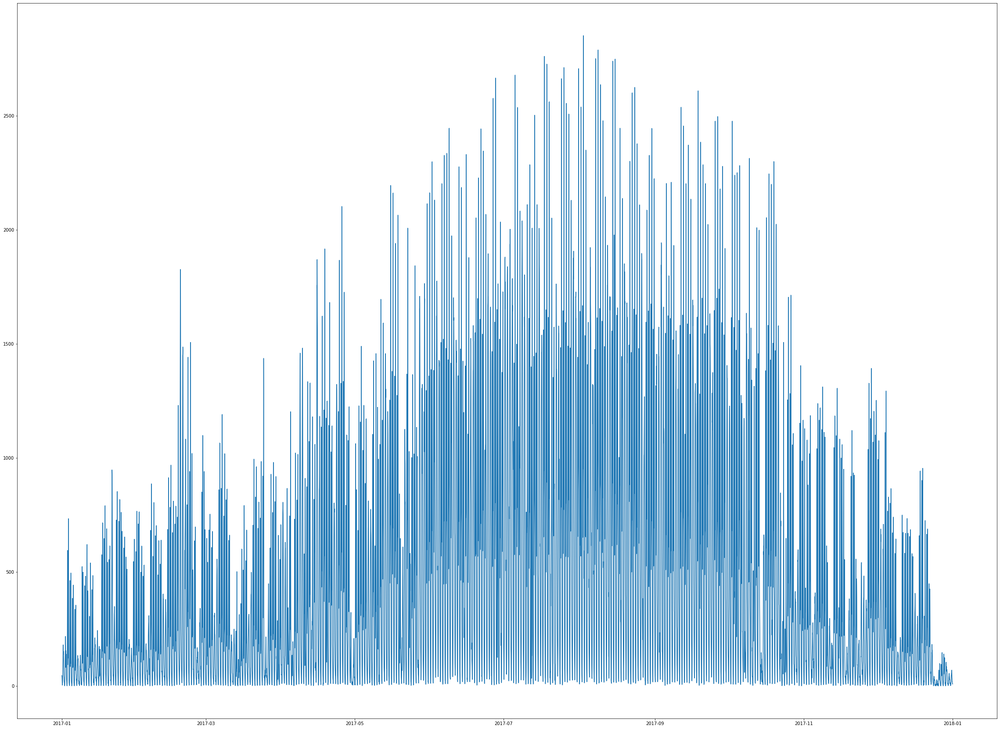

In [45]:
df_arima = chicago_final[['trips_per_hour']]


fig, ax = plt.subplots(figsize=(40,30))
ax.plot(df_arima)

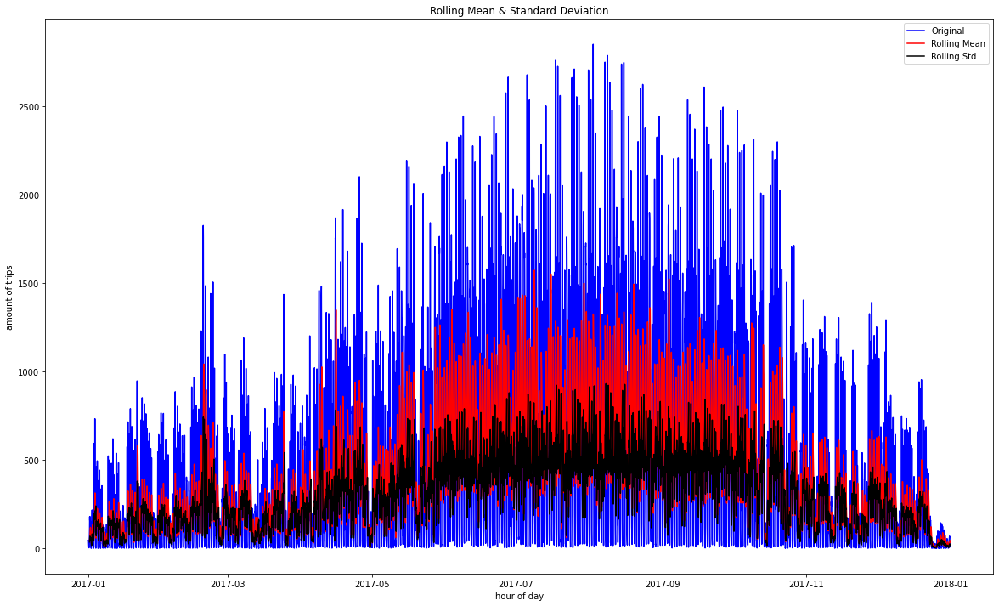

Results of Dickey-Fuller Test:

Test Statistic                   -5.009667
p-value                           0.000021
#Lags Used                       35.000000
Number of Observations Used    8707.000000
Critical Value (1%)              -3.431101
Critical Value (5%)              -2.861872
Critical Value (10%)             -2.566947
dtype: float64


In [46]:
#use function 
test_stationarity(df_arima['trips_per_hour'])

#### Interpretation:

• A stationary time series is one whose properties do not depend on the time at which the series is observed

• Thus, time series with trends, or with seasonality, are not stationary

• Time series is called stationary if one section of the data looks like any other section of the data  --> not given!

Data seems to be non stationary!

#### 4.2.2.3 Make Time Series stationary

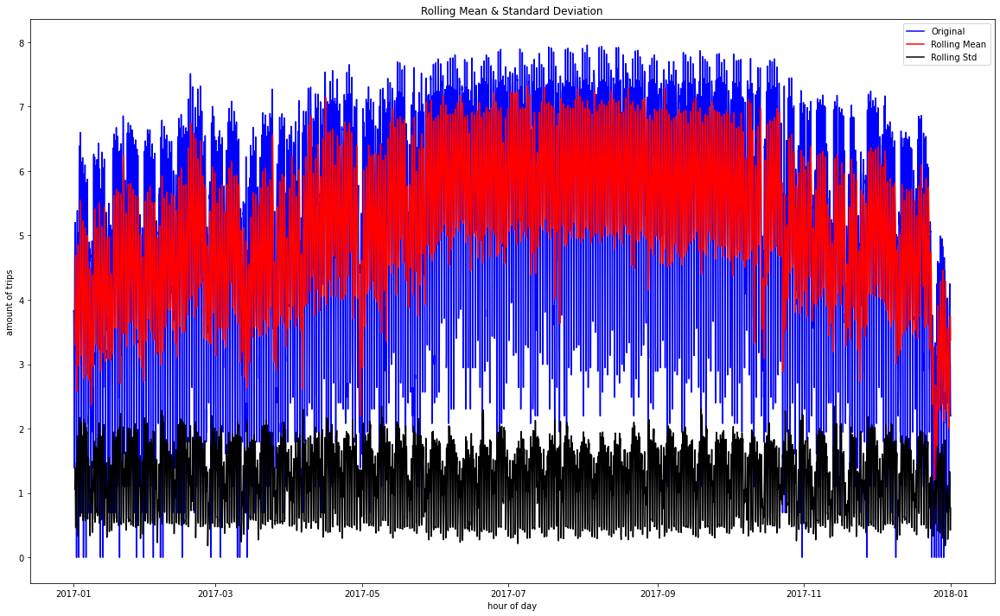

Results of Dickey-Fuller Test:

Test Statistic                   -5.295130
p-value                           0.000006
#Lags Used                       37.000000
Number of Observations Used    8705.000000
Critical Value (1%)              -3.431101
Critical Value (5%)              -2.861872
Critical Value (10%)             -2.566947
dtype: float64


In [47]:
#take log
arima_log = np.log(df_arima['trips_per_hour'])
test_stationarity(arima_log)

We can see slight improvement, but data still looks non stationary.

To  make it stationary, we need to eliminate Trend and Seasonality.

Ways of removing trend and seasonality:
    
1) Differencing – taking the differece with a particular time lag

2) Decomposition – modeling both trend and seasonality and removing them from the model.

#### 4.2.2.3.1 Differencing

non-stationary time series can become stationary time series by differencing

In [50]:
#shift and take difference
arima_log_diff = arima_log - arima_log.shift()

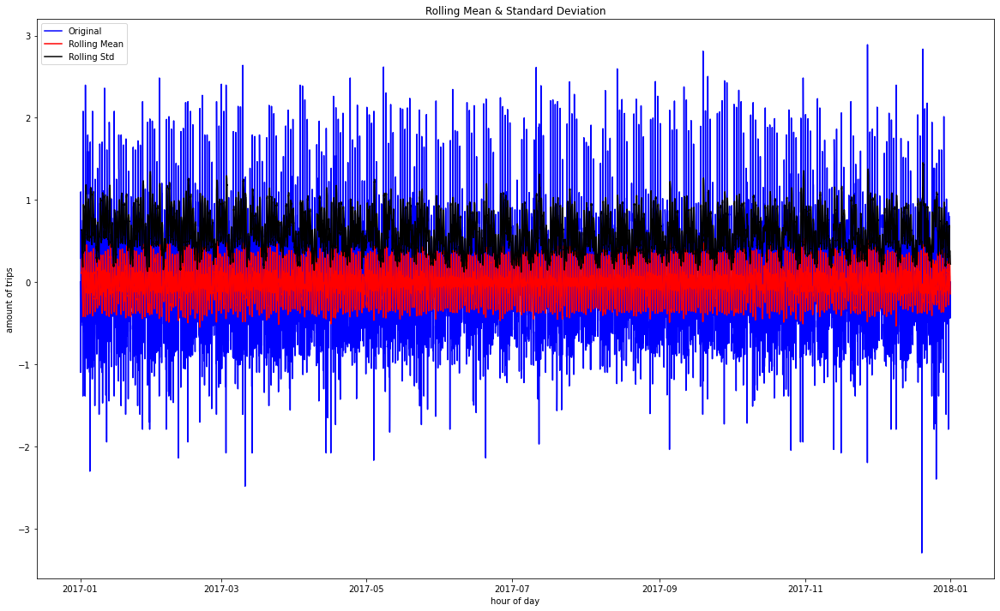

Results of Dickey-Fuller Test:

Test Statistic                -1.880022e+01
p-value                        2.022905e-30
#Lags Used                     3.700000e+01
Number of Observations Used    8.704000e+03
Critical Value (1%)           -3.431102e+00
Critical Value (5%)           -2.861872e+00
Critical Value (10%)          -2.566947e+00
dtype: float64


In [51]:
arima_log_diff.dropna(inplace = True)
test_stationarity(arima_log_diff)

This graph looks quite reasonable. The Dickey-Fuller test can be interpreted the following way: p-value is very small, which means we can reject the null hypotheseis of the test and confirm data is indeed stationary. The test statitsic shows a value of -18. The more negative this statistic, the more likely we are to reject the null hypothesis (we have a stationary dataset). 

As part of the output, we get a look-up table to help determine the ADF statistic. We can see that our statistic value of -18 is less than the value of -3.431 at 1%.
This suggests that we can reject the null hypothesis with a significance level of less than 1% (i.e. a low probability that the result is a statistical fluke).

#### 4.2.2.3.2 Decomposition

Time series data decomposition is a method to split data series into the components like a trend, seasonal, and irregular noise.

Trend component reflects the overall direction in data. It is mean value over time.
Seasonal component is variations that occur at specific regular intervals in data series (e.g., weekly, monthly). 
Irregular (noise) component is residuals that is a remaining part after removing the above components.
   
We can decompose time series data with seasonal_decompose function, and the plot looks as below.

<Figure size 432x288 with 0 Axes>

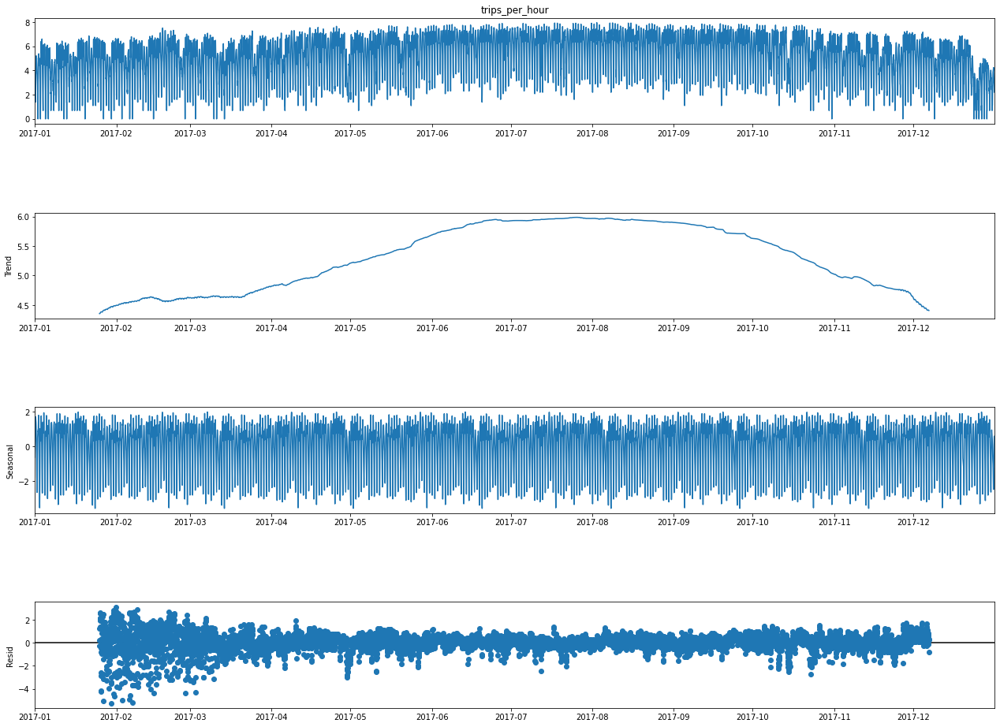

In [641]:
result = seasonal_decompose(arima_log, model='additive', period=(24*7*7))

residual = result.resid
trend = result.trend
seasonal = result.seasonal

fig = plt.figure()  
fig = result.plot()  
fig.set_size_inches(20, 15)

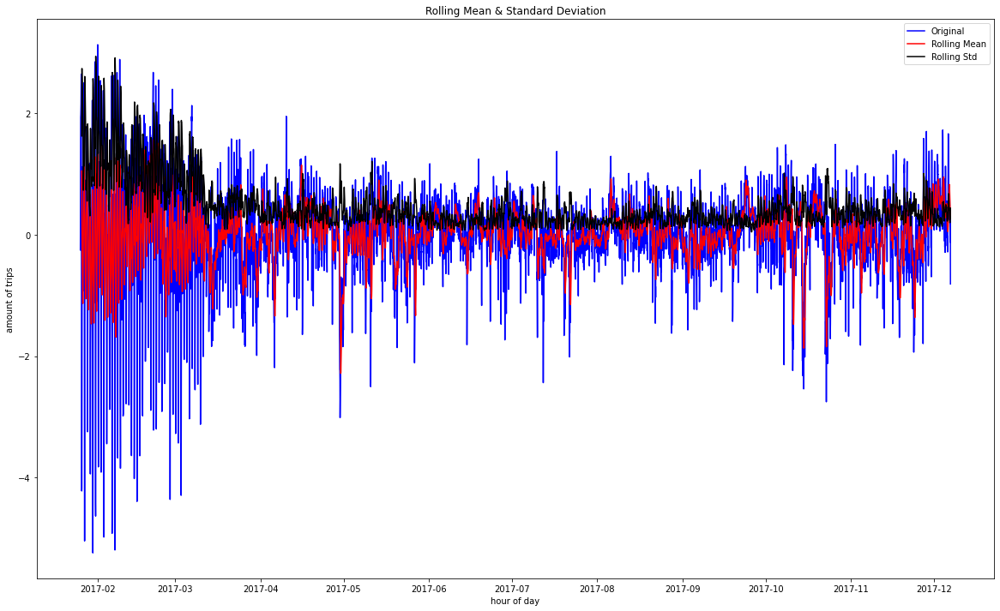

Results of Dickey-Fuller Test:

Test Statistic                -1.176983e+01
p-value                        1.096658e-21
#Lags Used                     3.600000e+01
Number of Observations Used    7.530000e+03
Critical Value (1%)           -3.431219e+00
Critical Value (5%)           -2.861924e+00
Critical Value (10%)          -2.566974e+00
dtype: float64


In [642]:
#model residuals
arima_log_decompose = residual
arima_log_decompose.dropna(inplace=True)
test_stationarity(arima_log_decompose)

#### 4.2.2.4 Check (Partial) Autocorrelation

We will look at the number of lags to determine the optimal p and q values for our ARIMA model:

(-0.2, 0.2)

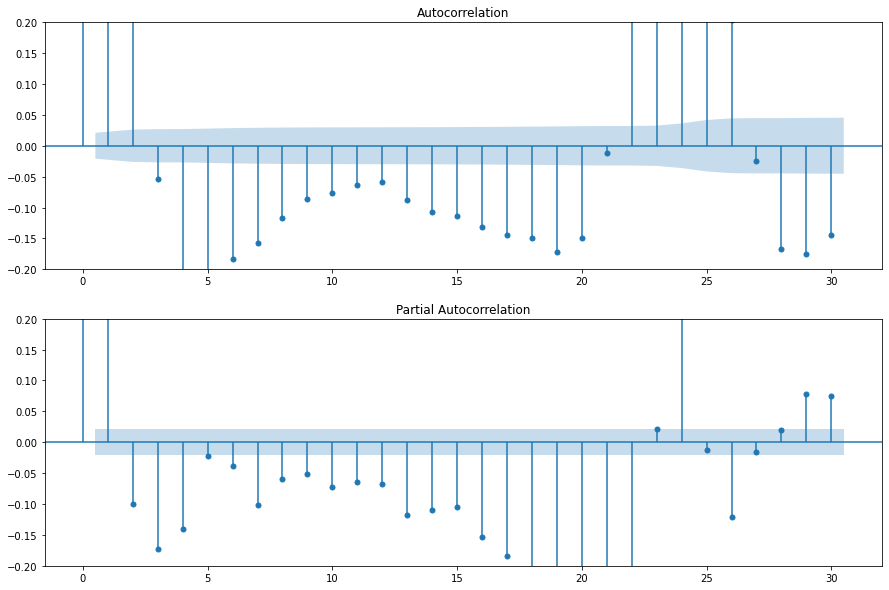

In [52]:
fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(arima_log_diff, ax=ax1, lags=30)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(arima_log_diff, ax=ax2, lags=30)
ax1.set_ylim([-0.2, 0.2])
ax2.set_ylim([-0.2, 0.2])

#### 4.2.2.7 ARIMA

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:593: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:593: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:593: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


                               SARIMAX Results                                
Dep. Variable:         trips_per_hour   No. Observations:                 8743
Model:                 ARIMA(2, 1, 3)   Log Likelihood               -6673.655
Date:                Sun, 23 Jan 2022   AIC                          13359.311
Time:                        15:52:45   BIC                          13401.766
Sample:                             0   HQIC                         13373.778
                               - 8743                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.5008      0.024     61.973      0.000       1.453       1.548
ar.L2         -0.6589      0.021    -30.818      0.000      -0.701      -0.617
ma.L1         -1.0926      0.026    -41.361      0.0

<AxesSubplot:ylabel='Density'>

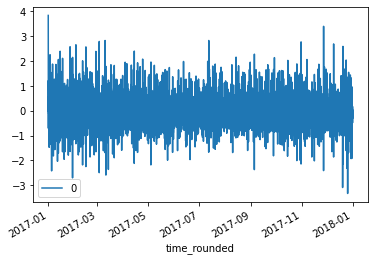

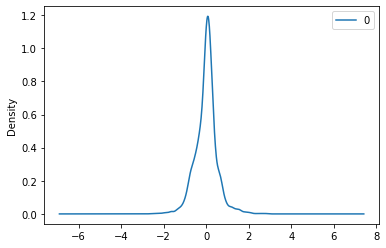

In [53]:
# Setting up ARIMA model
# p = AR = PACF lags = 2
# d = I = differences = 1
# q = MA = ACF lags = 3


model = ARIMA(arima_log, order=(2,1,3))
model_fit = model.fit()

# summary of fit model
print(model_fit.summary())

# line plot of residuals
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
# density plot of residuals
residuals.plot(kind='kde')

#### Notes:

Note that we have two AR  and 3 MA coeeficients as stated in the beginning. The independent variables the constant β
 the error term is sigma2 in our equation above. The ar.L1, ar.L2 are our lag variables.

In our model, all of the p-values are significant as they’re below the 0.05 threshold.

The log-likelihood function identifies a distribution that fits best with the sampled data. 

The Ljung Box test tests that the errors are white noise.

The Ljung-Box (L1) (Q) is the LBQ test statistic at lag 1 is , and the Prob(Q) is 0, and the p-value is 0.96. Since the probability is under 0.05, we can reject the null that the errors are white noise.

Heteroscedasticity tests that the error residuals are homoscedastic or have the same variance. The summary performs White’s test. Our summary statistics show a test statistic of 0,87 and a p-value of 0.00.

Jarque-Bera tests for the normality of errors. It tests the null that the data is normally distributed against an alternative of another distribution. We see a test statistic of 4139.79 with a probability of 0, which means we reject the null hypothesis, and the data is not normally distributed. Also, as part of the Jarque-Bera test, we see the distribution has a slight positive skew and a relatively large kurtosis.

Let's take a look at the log fitted prediction:

Text(0.5, 1.0, 'RSS: 2370.9309')

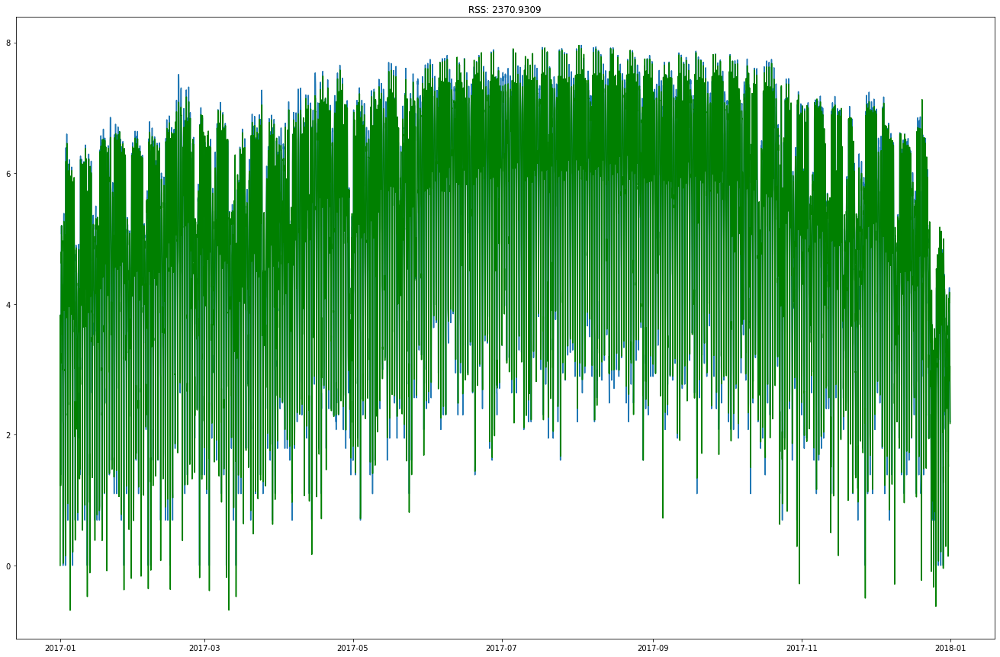

In [54]:
plt.figure(figsize=(23,15))
plt.plot(arima_log)
plt.plot(model_fit.fittedvalues, color='green')
plt.title('RSS: %.4f'% sum((model_fit.fittedvalues-arima_log)**2))

Zoom into last 700 values to get a better impression:

Text(0.5, 1.0, 'RSS: 2370.9309')

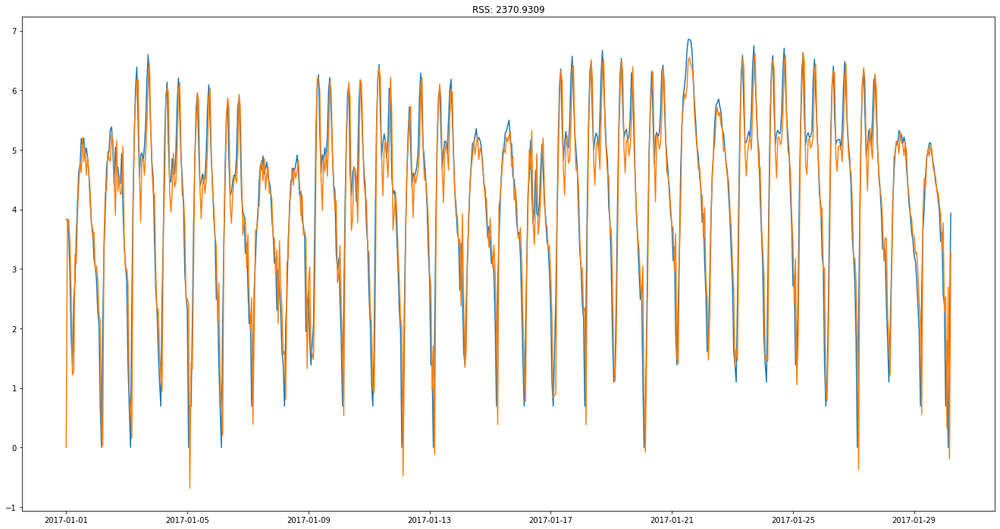

In [55]:
plt.figure(figsize=(23,12))
plt.plot(arima_log.head(700))
plt.plot(model_fit.fittedvalues.head(700))
plt.title('RSS: %.4f'% sum((model_fit.fittedvalues-arima_log)**2))

Let's exponentiate fittedvalues because we took log in the beginning. This should give us the real demand values.

Text(0.5, 1.0, 'RSS: 358256120.8235/ RMSE: 202.4261')

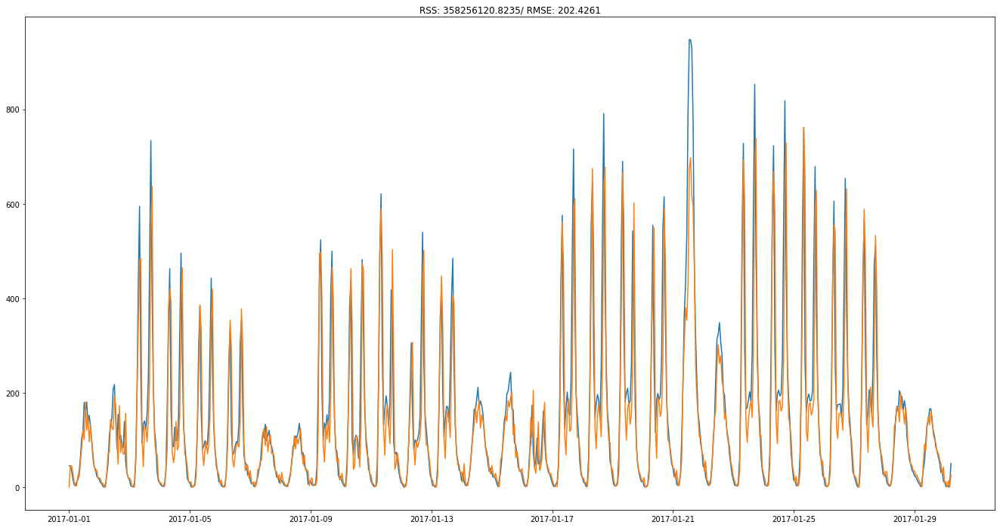

In [140]:
predictions_ARIMA = np.exp(model_fit.fittedvalues)
plt.figure(figsize=(23,12))
plt.plot(df_arima['trips_per_hour'].head(700))
plt.plot(predictions_ARIMA.head(700))
plt.title('RSS: %.4f'% sum((predictions_ARIMA-df_arima['trips_per_hour'])**2)+'/ RMSE: %.4f'% np.sqrt(sum((predictions_ARIMA-df_arima['trips_per_hour'])**2)/len(df_arima['trips_per_hour'])))

## 4.3 Model Evaluation

In order to evaluate and benchmark our models performance, we will use the root mean sqaured error (RMSE), which is similar to the mean squared error (MSE), however, the result is square rooted to make it more interpretable as it’s in base units (it is measured in the same units as the response variable). It tells us the square root of the average squared difference between the predicted values and the actual values in a dataset. The lower the RMSE, the better a model fits a dataset.

In [117]:
# show RMSE again
print('Tree regression RMSE: ',np.sqrt(mean_squared_error(y_test, Tree_reg_pred)))
print('Multi-Linear regression RMSE: ',np.sqrt(mean_squared_error(y_test, lin_reg_pred)))
print('ARIMA RMSE :',np.sqrt(mean_squared_error(df_arima['trips_per_hour'], predictions_ARIMA)))

Tree regression RMSE:  112.96701344863448
Multi-Linear regression RMSE:  408.2594316766653
ARIMA RMSE : 202.42612908350424


When comparing RMSE of the three regression models, the Tree regressor performs best. The worst performance delivers the multi-linear regression model. ARIMA model performance lies between the other two rgression models. 

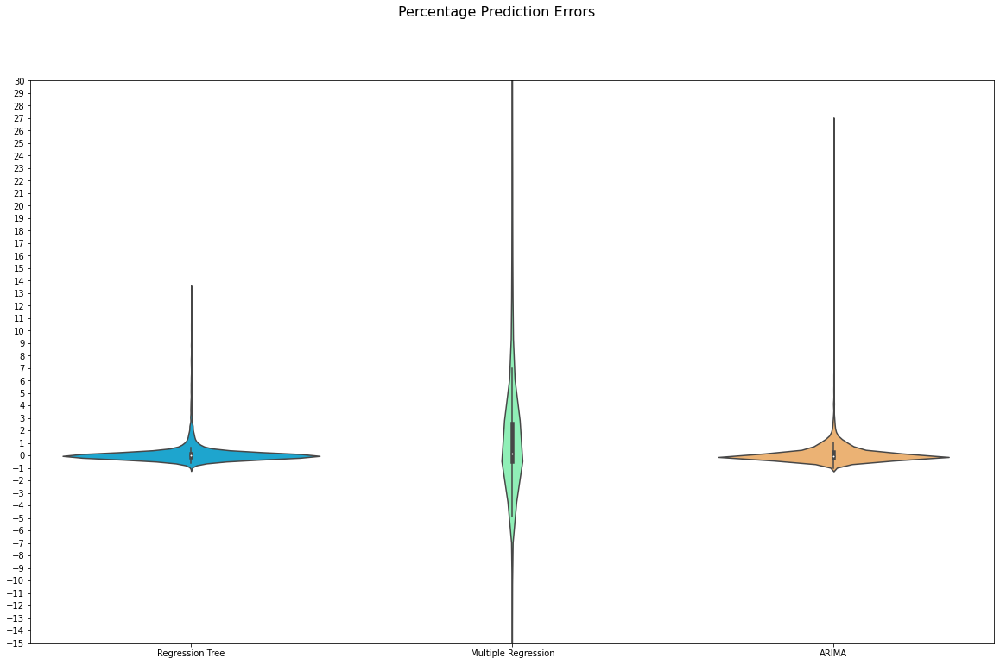

In [179]:
#plot performance
relerror_tree = (Tree_reg_pred.reshape(-1,1) - y_test)/y_test #Array of percentage prediction errors for boxplot
relerror_mr = (lin_reg_pred.reshape(-1,1) - y_test)/y_test
relerror_arima = (predictions_ARIMA - df_arima['trips_per_hour'])/df_arima['trips_per_hour']
    
    
fig1, ax2 = plt.subplots(figsize = (20,12))
fig1.suptitle("Percentage Prediction Errors",fontsize=16)

relerrors = [relerror_tree,
             relerror_mr,
             relerror_arima
            ]

names = ["Regression Tree",
                 "Multiple Regression",
                 "ARIMA"
        ]
sns.violinplot(data=relerrors,ax=ax2, palette = 'rainbow')
ax2.set(xticklabels=names)
ax2.set_ylim(-15, 30)
ax2.set_yticks(np.arange(-15,31, 1))

We can see that percentage deviation is relatively small for Rgression Tree and ARIMA. Both models have a relatively small number of high prediction deviations and mostly only divert between -1% and 2%, whereas MLR shows a lot more very high prediction deviations.

Therefore, one would choose the Tree Regression model for deployment or improve the ARIMA model further before deploying.

## 4.4 Outlook

#### How could the selected model be improved further?

Establishing the regression models to predict users’ demands is feasible. However, the models still have the following problems:

(1) The prediction error of user demand in all models is still relatively large, which will lead to unreliability in actual business operation.

(2) The ARIMA prediction model established in this study only highlights the role of time factor in prediction and  does not consider the influence of external factors. When great changes take place in the outside world, great deviations will always occur.

(3) ARIMA model could be further improved using cross validation. Because we only have limited data of one year, we chose not to cross validate. However, using more than one year of trip data, one could test the ARIMA model for different years and calculate the forecast error.

(4) ARIMA model could be extended to SARIMAX including seasonality patterns to improve results.

(5) ARIMA p,d,q parameters could be manipulated in search for better settings.

(6) Note that additional features (like holiday dummy) could be engineered using additional external data. This could improve regression problems with explanatory variables such as multiple linear regression.

# 4. Predictive Analytics

First of all we have to import the weather data

In [31]:
weather_data = pd.read_csv("/Users/moritz/Documents/Master/3. Semester/Analytics/Project/AA_assignment_team8/data/weather_hourly_chicago.csv") 
weather_data = weather_data[(weather_data['date_time'] >= '2017-01-01')
                     & (weather_data['date_time'] < '2017-12-31')]
weather_data['date_time'] = pd.to_datetime(weather_data['date_time']).dt.floor('min')

Lets fix Nans

Impute missing data (because missing data can be estimated easily and more accurate results)

In [32]:
#interpolation for weather data
weather_data['max_temp'].interpolate(method='slinear', inplace=True) 
weather_data['min_temp'].interpolate(method='slinear', inplace=True) 

#backward fill for precip (snow etc.) because can only be 0 or 1
weather_data['precip'].fillna(method='bfill', inplace=True) 

weather_data['max_temp'].fillna(method='bfill', inplace=True)
weather_data['min_temp'].fillna(method='bfill', inplace=True)

Extract rental data

In [33]:
df_by_date = chicago_data.groupby("date").agg(
        daily_trips=("bike_id","count"),
        daily_avg_length = ("trip_duration_minutes","mean"),
        daily_used_bikes=('bike_id', pd.Series.nunique))

df_by_date_merged = df_by_date.join(fleet_size)
df_by_date_merged["daily_usage"] = df_by_date_merged["daily_used_bikes"] / df_by_date_merged["fleet_size"]
df_by_date_merged["date_time"] = df_by_date_merged.index
df_by_date_merged['date_time'] = pd.to_datetime(df_by_date_merged['date_time']).dt.floor('min')

Merge rental data with weather data

In [34]:
chicago_data_with_weather = pd.merge(df_by_date_merged, weather_data, on='date_time', how='inner')
chicago_data_with_weather = chicago_data_with_weather.drop(columns={"daily_usage"})

## 4.1 Feature selection
For regression models we want to know which features are relevant

Text(0.5, 1.0, 'Chicago')

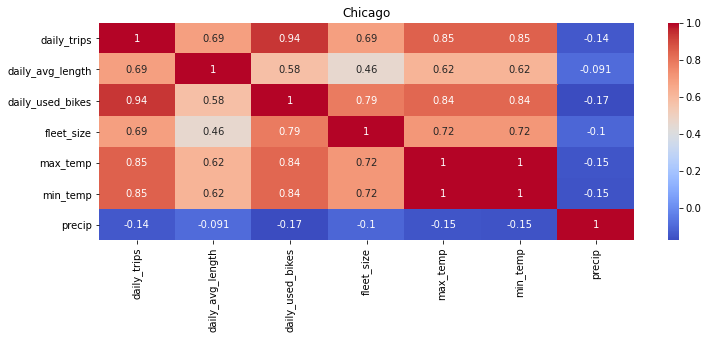

In [35]:
fig,ax  = plt.subplots(1,1,figsize=(12,4))

sns.heatmap(chicago_data_with_weather.corr(), annot=True,cmap ="coolwarm",ax=ax)

ax.set_title("Chicago")

Daily trips and max/min tempreature seems to be a good feature selection as they have ha high value. As daily_used_bikes is an equivalent to daily trips we decided to choose daily trips in our model.

## 4.2 Cross validation splitting

In [36]:
X = chicago_data_with_weather.drop(columns=["daily_trips"])
Y = chicago_data_with_weather[["daily_trips"]]

X_n =  min_max_scaling(X)

X_train, X_test, Y_train, Y_test = train_test_split(X_n, Y,test_size = 0.3)

## 4.3 Fitting regression model

We are handling data with continuous values. Therefore we decided to use regression models. We selected linear regression and a decision tree regressor for the analysis. Because we are dealing with time series the third analysis model we chose is the ARIMA model for multi-feature based aproaches.

In [40]:
# Decision tree regressor
Tree_reg = DecisionTreeRegressor(min_samples_leaf=10,criterion="mse")
Tree_reg.fit(X_train, Y_train)
Y_pred = Tree_reg.predict(X_test)

r2_tree = r2_score(Y_test, Y_pred)

# Linear regression
lin_reg_mod = LinearRegression(normalize=True)
lin_reg_mod.fit(X_train, Y_train)
Y_mr_pred = lin_reg_mod.predict(X_test)
    
r2_mr = r2_score(Y_test, Y_mr_pred)

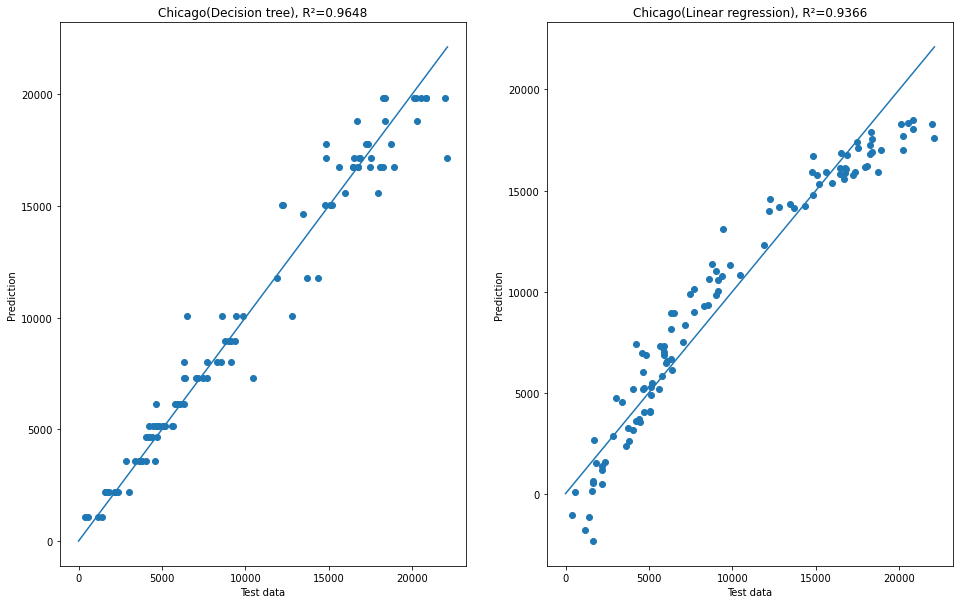

In [42]:
fig, axes = plt.subplots(1,2,figsize = (16,10))

axes[0].scatter(Y_test, Y_pred)
axes[0].set_title("Chicago(Decision tree), R²="+str(round(r2_tree,4)))
max=Y_test.max()["daily_trips"]
x = np.linspace(0, max,max)
axes[0].set_ylabel('Prediction')
axes[0].set_xlabel('Test data')
axes[0].plot(x,x)

axes[1].scatter(Y_test, Y_mr_pred)
axes[1].set_title("Chicago(Linear regression), R²="+str(round(r2_mr,4)))
max=Y_test.max()["daily_trips"]
x = np.linspace(0, max,max)
axes[1].set_ylabel('Prediction')
axes[1].set_xlabel('Test data')
axes[1].plot(x,x)

Error plots for regression model shows very good performing regression models as R^2 value is between 0.93 and 0.96. 

In [ ]:
plt.rcParams.update({'figure.figsize':(9,7), 'figure.dpi':120})

# Original Series
fig, axes = plt.subplots(3, 2, sharex=True)
axes[0, 0].plot(chicago_data_with_weather.daily_trips); axes[0, 0].set_title('Original Series')
plot_acf(chicago_data_with_weather.daily_trips, ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(chicago_data_with_weather.daily_trips.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(chicago_data_with_weather.daily_trips.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(chicago_data_with_weather.daily_trips.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(chicago_data_with_weather.daily_trips.diff().diff().dropna(), ax=axes[2, 1])

plt.show()

In [ ]:
# Find the order of the AR term
# PACF plot of 1st differenced series
plt.rcParams.update({'figure.figsize':(9,3), 'figure.dpi':120})

fig, axes = plt.subplots(1, 2, sharex=True)
axes[0].plot(chicago_data_with_weather.daily_trips.diff()); axes[0].set_title('1st Differencing')
axes[1].set(ylim=(0,5))
plot_pacf(chicago_data_with_weather.daily_trips.diff().dropna(), ax=axes[1])

plt.show()

In [ ]:
fig, axes = plt.subplots(1, 2, sharex=True)
axes[0].plot(chicago_data_with_weather.daily_trips); axes[0].set_title('no Differencing')
axes[1].set(ylim=(0,1.2))
plot_acf(chicago_data_with_weather.daily_trips.dropna(), ax=axes[1])

plt.show()

In [ ]:
from statsmodels.tsa.arima_model import ARIMA

# 1,1,0 ARIMA Model
model = ARIMA(chicago_data_with_weather.daily_trips, order=(2,1,0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

In [ ]:
# Plot residual errors
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

In [ ]:
# Actual vs Fitted
model_fit.plot_predict(dynamic=False)
plt.show()

## Outlook